# importing the necessary libraries

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt # matplotlib
import seaborn as sns # seaborn
from enum import Enum #enum support

#import the warnings.
import warnings
warnings.filterwarnings('ignore')

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os

### Color Pallete



In [2]:
class Color(Enum):
    Hot_Pink = '#EF7C8E'
    Cream = '#FAE8E0'
    Spearmint = '#B6E2D3'
    Rosewater = '#D8A7B1'
    Dusty_Rose = '#EED6D3'
    Light_Coffee_Pot ='#A49393'
    Dark_Coffee_Pot ='#67595E'
    Navy_Blue='#05445E'
    Blue_Grotto='#189AB4'
    Blue_Green='#75E6DA'
    Baby_Blue='#D4F1F4'
    Yellow='#FBE7C6'
    Mint='#B4F8C8'
    Tiffany_Blue='#A0E7E5'
    Light_Hot_Pink='#FFAEBC'


# Using the given dataset from the drive (via kaggle input dataset) 

In [3]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        if filename in ['loan.csv','Loan_Data_Dictionary.xlsx']:
            print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/av-ms-ds/loan.csv
/kaggle/input/av-ms-ds/Loan_Data_Dictionary.xlsx


In [4]:
loan_csv='/kaggle/input/av-ms-ds/loan.csv'
loan_dictionary='/kaggle/input/av-ms-ds/Loan_Data_Dictionary.xlsx'

# Step 1: Inspecting the given dataset.

## Read the dataset from loan.csv

In [5]:

loan_df = pd.read_csv(loan_csv)
loan_df

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,92187,92174,2500,2500,1075.0,36 months,8.07%,78.42,A,A4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39713,90665,90607,8500,8500,875.0,36 months,10.28%,275.38,C,C1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39714,90395,90390,5000,5000,1325.0,36 months,8.07%,156.84,A,A4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39715,90376,89243,5000,5000,650.0,36 months,7.43%,155.38,A,A2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Dimensions of the dataset 

In [6]:
loan_df.shape

(39717, 111)

In [7]:
loan_df.info("all")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #    Column                          Dtype  
---   ------                          -----  
 0    id                              int64  
 1    member_id                       int64  
 2    loan_amnt                       int64  
 3    funded_amnt                     int64  
 4    funded_amnt_inv                 float64
 5    term                            object 
 6    int_rate                        object 
 7    installment                     float64
 8    grade                           object 
 9    sub_grade                       object 
 10   emp_title                       object 
 11   emp_length                      object 
 12   home_ownership                  object 
 13   annual_inc                      float64
 14   verification_status             object 
 15   issue_d                         object 
 16   loan_status                     object 
 17   pymnt_plan

In [8]:
loan_df.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,...,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,...,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,...,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,...,NaN,NaN,NaN,NaN,2.000000,0.0,NaN,NaN,NaN,NaN


## It looks like there is some missing data (null values) from some columns. This needs to be cleansed._

In [9]:
#extracting some descriptive statistics for the rest of the columns including object types
loan_df.describe(include=object)

,term,int_rate,grade,sub_grade,emp_title,emp_length,home_ownership,verification_status,issue_d,loan_status,...,title,zip_code,addr_state,earliest_cr_line,revol_util,initial_list_status,last_pymnt_d,next_pymnt_d,last_credit_pull_d,application_type
count,39717,39717,39717,39717,37258,38642,39717,39717,39717,39717,...,39706,39717,39717,39717,39667,39717,39646,1140,39715,39717
unique,2,371,7,35,28820,11,5,3,55,3,...,19615,823,50,526,1089,1,101,2,106,1
top,36 months,10.99%,B,B3,US Army,10+ years,RENT,Not Verified,Dec-11,Fully Paid,...,Debt Consolidation,100xx,CA,Nov-98,0%,f,May-16,Jun-16,May-16,INDIVIDUAL
freq,29096,956,12020,2917,134,8879,18899,16921,2260,32950,...,2184,597,7099,370,977,39717,1256,1125,10308,39717


it is evident that columns dont have values and some data needs to be cleansed.

# Step 2: Data Cleaning

In [10]:
#checking for null values column wise
loan_df.isnull().sum()

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
                              ...  
tax_liens                        39
tot_hi_cred_lim               39717
total_bal_ex_mort             39717
total_bc_limit                39717
total_il_high_credit_limit    39717
Length: 111, dtype: int64

In [11]:
#util function for visualising null values in df

def visualize_null_values(df, rotation=45, figsize=(16, 10), cmap='plasma', annot=False, title_fontsize=12, font_family='Arial'):
    """
    Visualize null values in a pandas DataFrame using a heatmap.

    Parameters:
    - df: pandas DataFrame, the DataFrame containing null values to be visualized.
    - rotation: int, rotation angle for x-axis labels (default: 45).
    - figsize: tuple, size of the figure (default: (16, 10)).
    - cmap: str, colormap for the heatmap (default: 'plasma').
    - annot: bool, whether to annotate the cells with the numeric value (default: False).
    - title_fontsize: int, font size for the title (default: 12).
    - font_family: str, font family for the plot (default: 'Arial').

    Returns:
    - ax: matplotlib Axes object, the plot with the null values visualized.
    """
    if not isinstance(df, pd.DataFrame):
        raise TypeError("Input 'df' must be a pandas DataFrame")

    sns.set_style('whitegrid')
    fig, ax = plt.subplots(figsize=figsize, facecolor=Color.Cream.value)
    sns.heatmap(df.isnull(), cmap=cmap, annot=annot, ax=ax)
    ax.set_title('Null values visual plot', fontsize=title_fontsize, fontfamily=font_family)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=rotation, fontfamily=font_family)
    ax.set_yticklabels(ax.get_yticklabels(), fontfamily=font_family)

    return ax

# Example Usage:
# visualize_null_values(df)

<Axes: title={'center': 'Null values visual plot'}>

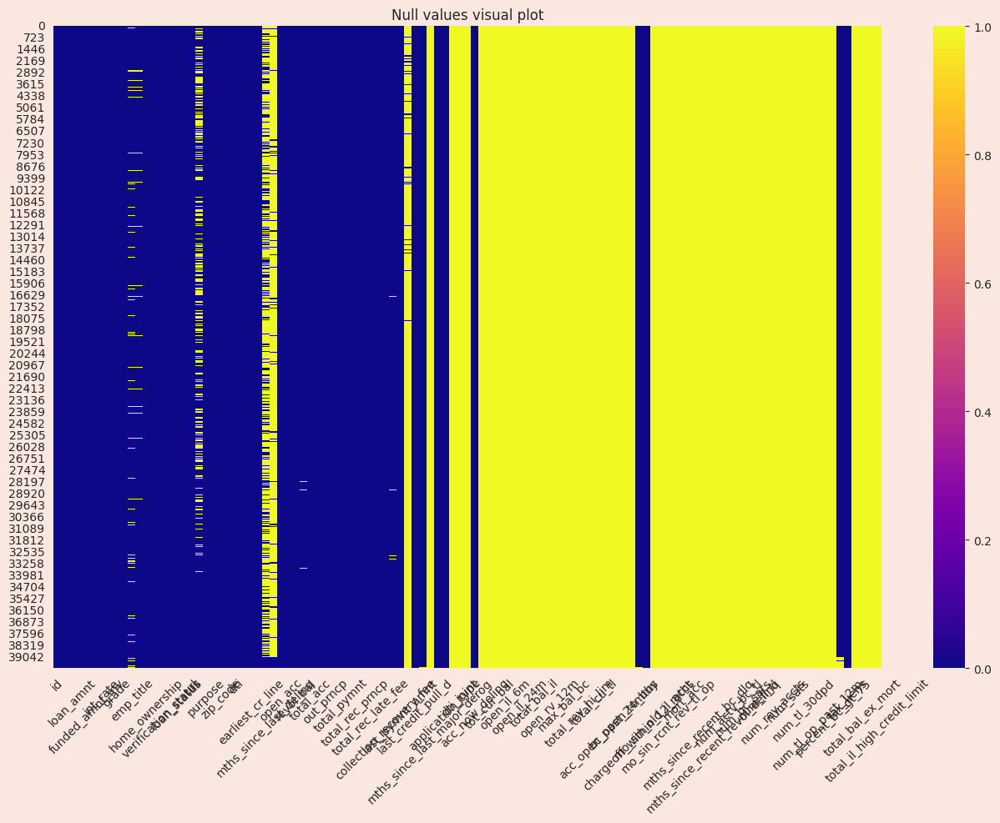

In [12]:
visualize_null_values(loan_df)

In [13]:
loan_df.shape

(39717, 111)

In [14]:
#calc percentage of null values column wise
round(loan_df.isnull().sum()/loan_df.shape[0]*100,2)

id                              0.0
member_id                       0.0
loan_amnt                       0.0
funded_amnt                     0.0
funded_amnt_inv                 0.0
                              ...  
tax_liens                       0.1
tot_hi_cred_lim               100.0
total_bal_ex_mort             100.0
total_bc_limit                100.0
total_il_high_credit_limit    100.0
Length: 111, dtype: float64

### remove columns having more than 90% null values

In [15]:
#remove columns having more than 90% null values
loan_df = loan_df.loc[: , loan_df.isnull().sum()/loan_df.shape[0] < 0.9]
loan_df.shape

(39717, 55)

In [16]:
#recalculating percentage of null values column wise
round(loan_df.isnull().sum()/loan_df.shape[0]*100,2)

id                             0.00
member_id                      0.00
loan_amnt                      0.00
funded_amnt                    0.00
funded_amnt_inv                0.00
term                           0.00
int_rate                       0.00
installment                    0.00
grade                          0.00
sub_grade                      0.00
emp_title                      6.19
emp_length                     2.71
home_ownership                 0.00
annual_inc                     0.00
verification_status            0.00
issue_d                        0.00
loan_status                    0.00
pymnt_plan                     0.00
url                            0.00
desc                          32.59
purpose                        0.00
title                          0.03
zip_code                       0.00
addr_state                     0.00
dti                            0.00
delinq_2yrs                    0.00
earliest_cr_line               0.00
inq_last_6mths              

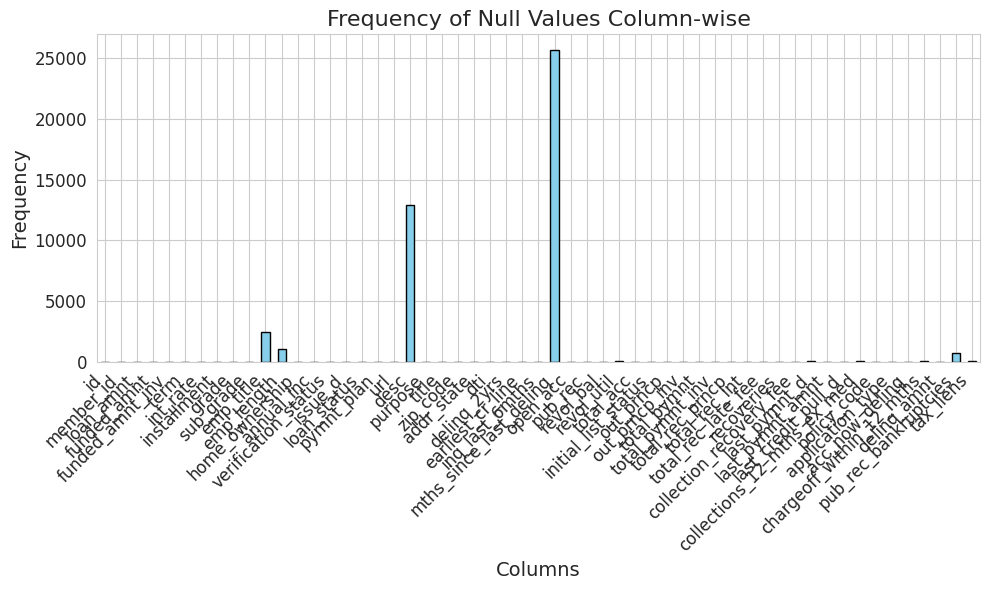

In [17]:
# Calculate the sum of null values column-wise
null_counts = loan_df.isnull().sum(axis=0)

# Plot histogram
plt.figure(figsize=(10, 6))
null_counts.plot(kind='bar', color='skyblue', edgecolor='black')

# Add titles and labels
plt.title('Frequency of Null Values Column-wise', fontsize=16)
plt.xlabel('Columns', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)

# Show plot
plt.tight_layout()
plt.show()

## Now let inspect row wise and remove rows having more null values

In [18]:
loan_df.isnull().sum(axis=1)

0        2
1        1
2        3
3        0
4        0
        ..
39712    4
39713    4
39714    6
39715    6
39716    4
Length: 39717, dtype: int64

In [19]:
# Checking for rows having more than 5 null values
loan_df[loan_df.isnull().sum(axis=1)>10]

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens


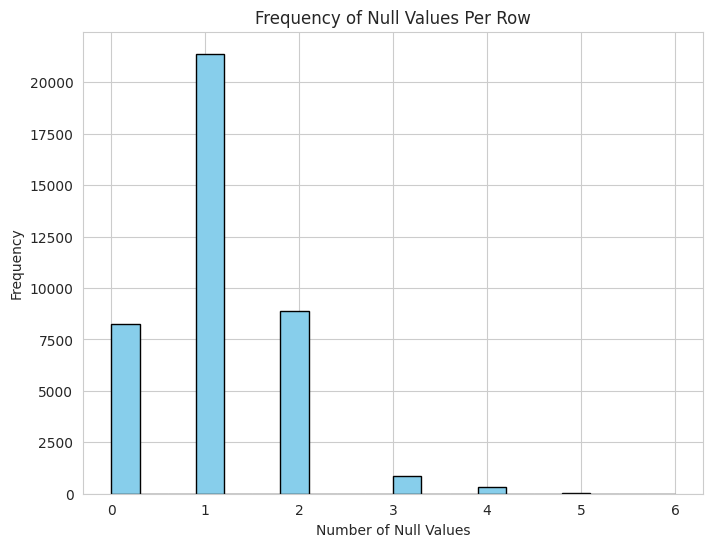

In [20]:
# Check for null values row-wise and calculate their frequency
null_counts_per_row = loan_df.isnull().sum(axis=1)

# Plot a histogram of the frequency of null values per row
plt.figure(figsize=(8, 6))
plt.hist(null_counts_per_row, bins=20, color='skyblue', edgecolor='black')
plt.title('Frequency of Null Values Per Row')
plt.xlabel('Number of Null Values')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

## Since we are in need of identifying the potential defaulters, the current loan records can be removed

In [21]:
#ignoring current loans 
loan_df = loan_df.drop(loan_df[loan_df['loan_status'] == 'Current'].index)
loan_df.shape

(38577, 55)

In [22]:
# Check for duplicate rows in dataset based on id column

print(loan_df.duplicated(subset=None, keep='first').count())
dup=loan_df[loan_df.duplicated(['id'])]
dup

38577


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens


### There are no duplicate rows in loan dataset

In [23]:
loan_df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,171.62,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,119.66,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,649.91,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,357.48,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
5,1075269,1311441,5000,5000,5000.0,36 months,7.90%,156.46,A,A4,...,161.03,Jan-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0


Removal of uneccessary columns.

### Some of these columns have values which are singled valued (common value across all the rows) , which could not assist us in our analysis.

### Util function to drop single-valued columns 

In [24]:

# Function to identify single-valued columns 
def identify_single_valued_columns(df):
    single_valued_columns = []
    for column in df.columns:
        unique_values = df[column].unique()
        if len(unique_values) == 1:
            single_valued_columns.append(column)
            print(f"Column '{column}' has a single unique value: {unique_values[0]}")
    return single_valued_columns


In [25]:
columnsToDrop = identify_single_valued_columns(loan_df)


Column 'pymnt_plan' has a single unique value: n
Column 'initial_list_status' has a single unique value: f
Column 'out_prncp' has a single unique value: 0.0
Column 'out_prncp_inv' has a single unique value: 0.0
Column 'policy_code' has a single unique value: 1
Column 'application_type' has a single unique value: INDIVIDUAL
Column 'acc_now_delinq' has a single unique value: 0
Column 'delinq_amnt' has a single unique value: 0


### the above columns are single-valued. These don't contribute anything in the analysis as they have a single value throughout and hence dropped.

In [26]:
loan_df = loan_df.drop(columns=columnsToDrop)
loan_df.shape

(38577, 47)

### few columns are not relevant to credit risk analysis and it is essential to remove them

In [27]:
loan_df.describe()
loan_df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,chargeoff_within_12_mths,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,0.00,0.00,0.00,Jan-15,171.62,May-16,0.0,0.0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,0.00,117.08,1.11,Apr-13,119.66,Sep-13,0.0,0.0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,0.00,0.00,0.00,Jun-14,649.91,May-16,0.0,0.0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,16.97,0.00,0.00,Jan-15,357.48,Apr-16,0.0,0.0,0.0,0.0
5,1075269,1311441,5000,5000,5000.0,36 months,7.90%,156.46,A,A4,...,0.00,0.00,0.00,Jan-15,161.03,Jan-16,0.0,0.0,0.0,0.0


In [28]:
#removing irrelevant columns having only generic information
drop_list = ["member_id","url","emp_title","zip_code","title"]
loan_df.drop(labels = drop_list, axis =1, inplace=True)
loan_df.head()

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,...,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,chargeoff_within_12_mths,pub_rec_bankruptcies,tax_liens
0,1077501,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,10+ years,...,0.00,0.00,0.00,Jan-15,171.62,May-16,0.0,0.0,0.0,0.0
1,1077430,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,< 1 year,...,0.00,117.08,1.11,Apr-13,119.66,Sep-13,0.0,0.0,0.0,0.0
2,1077175,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,10+ years,...,0.00,0.00,0.00,Jun-14,649.91,May-16,0.0,0.0,0.0,0.0
3,1076863,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,10+ years,...,16.97,0.00,0.00,Jan-15,357.48,Apr-16,0.0,0.0,0.0,0.0
5,1075269,5000,5000,5000.0,36 months,7.90%,156.46,A,A4,3 years,...,0.00,0.00,0.00,Jan-15,161.03,Jan-16,0.0,0.0,0.0,0.0


There are some columns with 0.0 values . Examining these columns to see if these can be removed as well in case these are mostly single valued

In [29]:
identify_single_valued_columns(loan_df)

[]

If there are missing values (NaNs) in the Series, they will be counted as unique values but not in `value_counts()`, which excludes NaNs by default.

In [30]:
#checking some columns having maximum single value and removing them 
for col in loan_df.columns:
    if loan_df[col].value_counts().count() == 1:
        print("Droping ",col)
        #lets drop these columns as well, since they will have no impact on the analysis
        loan_df.drop(col,axis=1,inplace=True)


Droping  collections_12_mths_ex_med
Droping  chargeoff_within_12_mths
Droping  tax_liens


In [31]:


loan_df.to_csv('cleaned_loan_data.csv')
loan_df.shape

(38577, 39)

The dataset includes information on loan grades and subgrades. Credit assessment algorithms like the FICO score typically categorize borrowers into various credit grades, reflecting their creditworthiness. These grades span from excellent to poor, aiding lenders in assessing the risk of extending credit to individuals. Given the availability of these grades, redundant columns aimed at assessing creditworthiness can be removed from the spreadsheet. Additionally, certain columns predominantly consist of 80-90% identical values.

Recoveries from charged-off or defaulted credit have minimal impact on the analysis as the credit has already been classified as charged off.

In [32]:
#checking if grades have any nulls  
loan_df['grade'].isnull().value_counts()


grade
False    38577
Name: count, dtype: int64

In [33]:
#checking if subgrades have any nulls 
loan_df['sub_grade'].isnull().value_counts()

sub_grade
False    38577
Name: count, dtype: int64

### In order to streamline the dataset and improve its efficiency, columns containing ad hoc information for credit score calculation will be removed. These columns are identified by their overwhelming prevalence of single values.

In [34]:
#removing columns that provide adhoc information on calculating credit score . 
#these columns have maximum single values
drop_adhoc_rec_cols_list = ["pub_rec_bankruptcies","pub_rec","last_credit_pull_d","total_rec_late_fee","recoveries","collection_recovery_fee","delinq_2yrs","earliest_cr_line","last_credit_pull_d","revol_util"]
loan_df.drop(labels = drop_adhoc_rec_cols_list, axis =1, inplace=True)
loan_df.shape

(38577, 30)

In [35]:
# difference between the funded_amnt and funded_amnt_inv
loan_df['funded_amnt_bal'] = loan_df['funded_amnt'] - loan_df['funded_amnt_inv']
loan_df['funded_amnt_bal'].value_counts()

funded_amnt_bal
0.00000      19347
25.00000      3734
50.00000      1661
250.00000     1207
100.00000      721
             ...  
343.00886        1
793.12733        1
297.02005        1
125.00427        1
258.65901        1
Name: count, Length: 7364, dtype: int64

Given that fees are commonly reflected in the funded_amnt_inv column across most records, it is deemed necessary to preserve this column in its current state.

# Step 3: Fixing Rows and Columns

In [36]:
# checking the datatypes of the columns
loan_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38577 entries, 0 to 39716
Data columns (total 31 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      38577 non-null  int64  
 1   loan_amnt               38577 non-null  int64  
 2   funded_amnt             38577 non-null  int64  
 3   funded_amnt_inv         38577 non-null  float64
 4   term                    38577 non-null  object 
 5   int_rate                38577 non-null  object 
 6   installment             38577 non-null  float64
 7   grade                   38577 non-null  object 
 8   sub_grade               38577 non-null  object 
 9   emp_length              37544 non-null  object 
 10  home_ownership          38577 non-null  object 
 11  annual_inc              38577 non-null  float64
 12  verification_status     38577 non-null  object 
 13  issue_d                 38577 non-null  object 
 14  loan_status             38577 non-null  obj

## In the display above, it's evident that certain columns have the data type 'object'. 
Let's explore whether converting some of these columns to different data types would enhance our analysis. 

For example, 'int_rate' could potentially be converted to a numerical data type.

In [37]:
#Check few values of int_rate
loan_df['int_rate'].value_counts()


int_rate
10.99%    913
11.49%    790
7.51%     787
13.49%    749
7.88%     725
         ... 
16.15%      1
21.48%      1
24.40%      1
16.01%      1
14.67%      1
Name: count, Length: 370, dtype: int64

In [38]:
#convert int_rate to numerical values
def convert_percent_col_numerical(df,col):
    return pd.to_numeric(df[col].str.rstrip('%'), errors='coerce')


In [39]:
loan_df['int_rate']=convert_percent_col_numerical(loan_df,'int_rate')

In [40]:
#check few values of employee length
loan_df['emp_length'].value_counts()

emp_length
10+ years    8488
< 1 year     4508
2 years      4291
3 years      4012
4 years      3342
5 years      3194
1 year       3169
6 years      2168
7 years      1711
8 years      1435
9 years      1226
Name: count, dtype: int64

It's apparent from the data provided that "emp_length" can be represented either as a numerical value or split into ranges. While it could have been treated as a categorical variable, the only meaningful ranges present are "10+" and "<1". Hence, we can also convert this to numerical format. **

In [41]:
#function to convert emp_length to numerical
loan_df.emp_length.fillna('0',inplace=True)
loan_df['emp_length']=loan_df.emp_length.str.extract('(\d+)')
loan_df['emp_length'].value_counts()

emp_length
10    8488
1     7677
2     4291
3     4012
4     3342
5     3194
6     2168
7     1711
8     1435
9     1226
0     1033
Name: count, dtype: int64

In [42]:
# changing the data type of column "term" from object to int
loan_df.term = loan_df.term.apply(lambda x: int(x.split()[0]))
loan_df.term.dtype

dtype('int64')

In [43]:
loan_df.term

0        36
1        60
2        36
3        36
5        36
         ..
39712    36
39713    36
39714    36
39715    36
39716    36
Name: term, Length: 38577, dtype: int64

## Derieved columns

***Extracting the month and year from the issue date of the loan and dropping the old column***

In [44]:
# create "month" and "year" columns from the column variable issue_d 
loan_df['issue_mnth'] = loan_df.issue_d.apply(lambda x: x.split('-')[0])

loan_df['issue_yr'] = loan_df.issue_d.apply(lambda x: int(x.split('-')[1])+2000)

#drop the column "issue_d"
loan_df.drop("issue_d", axis=1, inplace=True)

loan_df.head()

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,...,total_acc,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,last_pymnt_d,last_pymnt_amnt,funded_amnt_bal,issue_mnth,issue_yr
0,1077501,5000,5000,4975.0,36,10.65,162.87,B,B2,10,...,9,5863.155187,5833.84,5000.00,863.16,Jan-15,171.62,25.0,Dec,2011
1,1077430,2500,2500,2500.0,60,15.27,59.83,C,C4,1,...,4,1008.710000,1008.71,456.46,435.17,Apr-13,119.66,0.0,Dec,2011
2,1077175,2400,2400,2400.0,36,15.96,84.33,C,C5,10,...,10,3005.666844,3005.67,2400.00,605.67,Jun-14,649.91,0.0,Dec,2011
3,1076863,10000,10000,10000.0,36,13.49,339.31,C,C1,10,...,37,12231.890000,12231.89,10000.00,2214.92,Jan-15,357.48,0.0,Dec,2011
5,1075269,5000,5000,5000.0,36,7.90,156.46,A,A4,3,...,12,5632.210000,5632.21,5000.00,632.21,Jan-15,161.03,0.0,Dec,2011


In [45]:
loan_df.shape

(38577, 32)

#### I think we have a reduced data frame with most of the very essential details needed for data analysis to identify the potential defaulters

# Step 4. Exploratory Data Analysis

## Univariate Analysis

In [46]:
def univariate_analysis_statistics(df):
    # Loop through each column in the loan dataset
    print("\n\nNumerical Values\n")
    for col in df.columns:
        
        if df[col].dtype in ['int64','float64']:
            # Calculate mean, median, and mode
            col_mean = "{:.2f}".format(df[col].mean())
            col_median = df[col].median()
            col_mode = df[col].mode()[0]

            # Print column name, data type, number of unique values, mean, median, and mode
            print(f"Column Name: {col}, Type: {df[col].dtype} -----> Unique Values: {df[col].nunique()}, Mean: {col_mean}, Median: {col_median}, Mode: {col_mode}")
    print("\n\nCategorical Values\n")
    for col in df.columns:

        if df[col].dtype not in ['int64','float64']:
            print(f"Column Name: {col}, Type: {df[col].dtype} -----> Unique Values: {df[col].nunique()}")



In [47]:
univariate_analysis_statistics(loan_df)



Numerical Values

Column Name: id, Type: int64 -----> Unique Values: 38577, Mean: 676378.71, Median: 656423.0, Mode: 54734
Column Name: loan_amnt, Type: int64 -----> Unique Values: 870, Mean: 11047.03, Median: 9600.0, Mode: 10000
Column Name: funded_amnt, Type: int64 -----> Unique Values: 1019, Mean: 10784.06, Median: 9550.0, Mode: 10000
Column Name: funded_amnt_inv, Type: float64 -----> Unique Values: 8050, Mean: 10222.48, Median: 8733.44, Mode: 5000.0
Column Name: term, Type: int64 -----> Unique Values: 2, Mean: 41.90, Median: 36.0, Mode: 36
Column Name: int_rate, Type: float64 -----> Unique Values: 370, Mean: 11.93, Median: 11.71, Mode: 10.99
Column Name: installment, Type: float64 -----> Unique Values: 15022, Mean: 322.47, Median: 277.86, Mode: 311.11
Column Name: annual_inc, Type: float64 -----> Unique Values: 5215, Mean: 68777.97, Median: 58868.0, Mode: 60000.0
Column Name: dti, Type: float64 -----> Unique Values: 2853, Mean: 13.27, Median: 13.37, Mode: 0.0
Column Name: inq_las

In contrast, the categorical values offer insights into the diversity and granularity of loan categorizations. Notably, the 'addr_state' column stands out with its high cardinality, suggesting geographical diversity. Additionally, 'sub_grade' provides a finer classification within the loan grading system.

It is evident from above that unique values that can be categorical have the higher range of 50(addr_state). Address state values are abbreviated. One of the better estimates of a higher range is 35(sub_grade) since sub grades cannot be more than 35.

## extracting numerical variables from the list

In [48]:
#extracting numerical variables from the list
def extract_numerical_cols(df):
    num_cols=[]
    for col in df.columns:
        if df[col].nunique() > 35 and (df[col].dtype == np.int64 or df[col].dtype == np.float64):
            num_cols.append(col)
            print("Name :",col,"- >", df[col].nunique(),"- >", df[col].dtype)
    return num_cols
num_cols=extract_numerical_cols(loan_df)
num_cols

Name : id - > 38577 - > int64
Name : loan_amnt - > 870 - > int64
Name : funded_amnt - > 1019 - > int64
Name : funded_amnt_inv - > 8050 - > float64
Name : int_rate - > 370 - > float64
Name : installment - > 15022 - > float64
Name : annual_inc - > 5215 - > float64
Name : dti - > 2853 - > float64
Name : mths_since_last_delinq - > 95 - > float64
Name : open_acc - > 40 - > int64
Name : revol_bal - > 21275 - > int64
Name : total_acc - > 82 - > int64
Name : total_pymnt - > 36714 - > float64
Name : total_pymnt_inv - > 36387 - > float64
Name : total_rec_prncp - > 6841 - > float64
Name : total_rec_int - > 34025 - > float64
Name : last_pymnt_amnt - > 34418 - > float64
Name : funded_amnt_bal - > 7364 - > float64


['id',
 'loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'int_rate',
 'installment',
 'annual_inc',
 'dti',
 'mths_since_last_delinq',
 'open_acc',
 'revol_bal',
 'total_acc',
 'total_pymnt',
 'total_pymnt_inv',
 'total_rec_prncp',
 'total_rec_int',
 'last_pymnt_amnt',
 'funded_amnt_bal']

## extracting categorical variables from the list

In [49]:

#extracting categorical variables from the list
def extract_categorical_cols(df):
    cat_cols=[]
    for col in df.columns:
        if loan_df[col].nunique() <= 35 :
            cat_cols.append(col)
            print("Name :",col,"- >", df[col].nunique(),"- >", df[col].dtype)
    return cat_cols
cat_cols=extract_categorical_cols(loan_df)
cat_cols

Name : term - > 2 - > int64
Name : grade - > 7 - > object
Name : sub_grade - > 35 - > object
Name : emp_length - > 11 - > object
Name : home_ownership - > 5 - > object
Name : verification_status - > 3 - > object
Name : loan_status - > 2 - > object
Name : purpose - > 14 - > object
Name : inq_last_6mths - > 9 - > int64
Name : issue_mnth - > 12 - > object
Name : issue_yr - > 5 - > int64


['term',
 'grade',
 'sub_grade',
 'emp_length',
 'home_ownership',
 'verification_status',
 'loan_status',
 'purpose',
 'inq_last_6mths',
 'issue_mnth',
 'issue_yr']

In [50]:

#we can add more variables here
edited_num_cols = ['id',
 'loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'int_rate',
 'installment',
 'annual_inc',
 'dti',
 'mths_since_last_delinq',
 'open_acc',
 'revol_bal',
 'total_acc',
 'total_pymnt',
 'total_pymnt_inv',
 'total_rec_prncp',
 'total_rec_int',
 'last_pymnt_amnt',
 'funded_amnt_bal']
edited_cat_cols = ['term',
 'grade',
 'sub_grade',
 'emp_length',
 'home_ownership',
 'verification_status',
 'loan_status',
 'purpose',
 'inq_last_6mths',
 'issue_mnth',
 'issue_yr',
 'last_pymnt_mnth']

Numerical Univariate Analysis


We have a task at hand: to detect and eliminate outlier values while also capturing the density of continuous variables. Our plan involves crafting a function to generate box plots and another to identify and eradicate outliers. Additionally, we aim to visualize the distribution of these continuous variables.

Util function to plot customized box plot

In [51]:
#define a function to plot box plot
def show_boxplot(df,column,xLabel):
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111)
    boxplot = ax.boxplot(df[column], patch_artist=True, notch=True, sym='o', vert=False,
                     widths=0.5, showcaps=True, showfliers=True, showmeans=True, meanline=True)
    colors = [Color.Hot_Pink.value] 
    for patch, color in zip(boxplot['boxes'], colors):
       patch.set_facecolor(color)
    #plt.xlabel(xLabel,fontsize=16,color='w')
    plt.show()

Util function to remove outliers

Util function to plot distribution

In [52]:
def plot_density_distribution(df,column, title, xLabel) : 
    plt.figure(figsize=(10,5),facecolor=Color.Spearmint.value)
    sns.distplot(df[column],rug = True)
    plt.title(title,fontsize=16,color='b')
    plt.xlabel(xLabel,fontsize=16,color='b')
    plt.show()

Util function to plot several box plots together

In [53]:
def show_boxplot_subplots(data, figsize=(15, 8), facecolor=Color.Spearmint.value, rows=2, cols=3):
    """
    Plots boxplots of multiple columns of a DataFrame using subplots.
    
    Parameters:
        data (DataFrame): The input data.
        figsize (tuple): Figure size (width, height).
        facecolor (str): Background color of the figure.
        rows (int): Number of rows for subplots.
        cols (int): Number of columns for subplots.
    """
    plt.figure(figsize=figsize, facecolor=facecolor)
    sns.set_style("dark")
    
    for i, column in enumerate(data):
        print('Enumerating', column , 'over index', i)
        ax = plt.subplot(rows, cols, i+1)
        ax.set_title(f'{column} - Distribution Plot', fontsize=14, color=Color.Navy_Blue.value)
        ax.set_xlabel(column, fontsize=14, color=Color.Dark_Coffee_Pot.value)
        
        boxplot = ax.boxplot(data[column], patch_artist=True, notch=True, sym='o', vert=False,
                     widths=0.5, showcaps=True, showfliers=True, showmeans=True, meanline=True)
        colors = [Color.Rosewater.value] 
        for patch, color in zip(boxplot['boxes'], colors):
           patch.set_facecolor(color)
    plt.tight_layout()
    plt.show()
    


### util function to plot a simple box plot

In [141]:
#define a function to plot box plot
def show_simple_boxplot(df,column, xlabel):
    fig = plt.figure(figsize=(6, 6))
    # Set style and color palette
    sns.set(style="whitegrid")
    custom_palette = sns.color_palette("husl", 5)

    # Create box plot
    sns.boxplot(data=df[column], palette=custom_palette)

    # Add labels
    plt.title('Box Plot of Sample Data')
    plt.xlabel(xlabel)
    plt.ylabel(f'Distribution of {column}')

    # Show the plot
    plt.show()

Util function to plot several histogram/density plots together

Enumerating annual_inc over index 0
Enumerating loan_amnt over index 1
Enumerating int_rate over index 2
Enumerating installment over index 3
Enumerating funded_amnt over index 4
Enumerating funded_amnt_inv over index 5


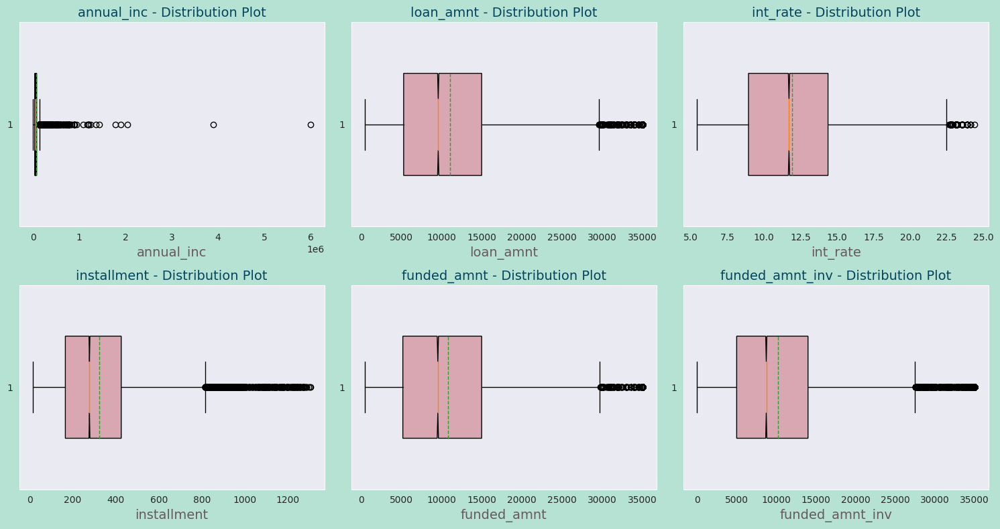

In [55]:
#plot boxplot in subplots for all continous variables
data = {
    'annual_inc' : loan_df['annual_inc'],
    'loan_amnt' : loan_df['loan_amnt'],
    'int_rate' : loan_df['int_rate'],
    'installment' : loan_df['installment'],
    'funded_amnt': loan_df['funded_amnt'],
    'funded_amnt_inv': loan_df['funded_amnt_inv'],
}

show_boxplot_subplots(data)

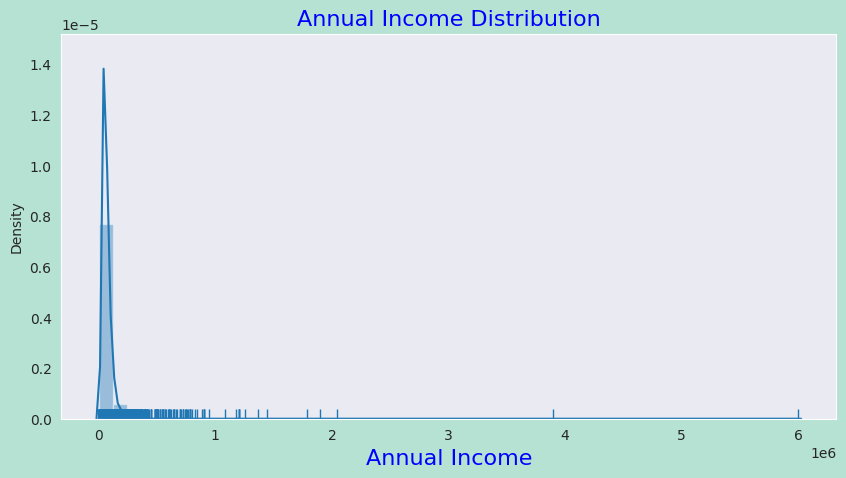

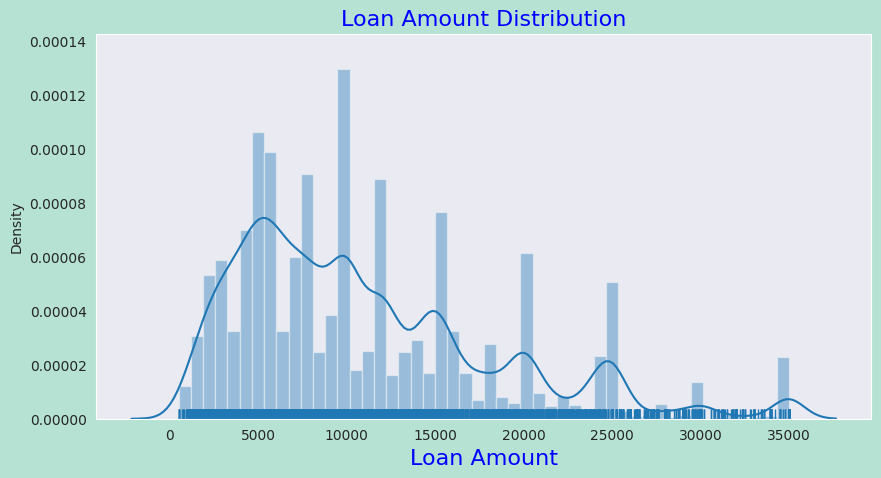

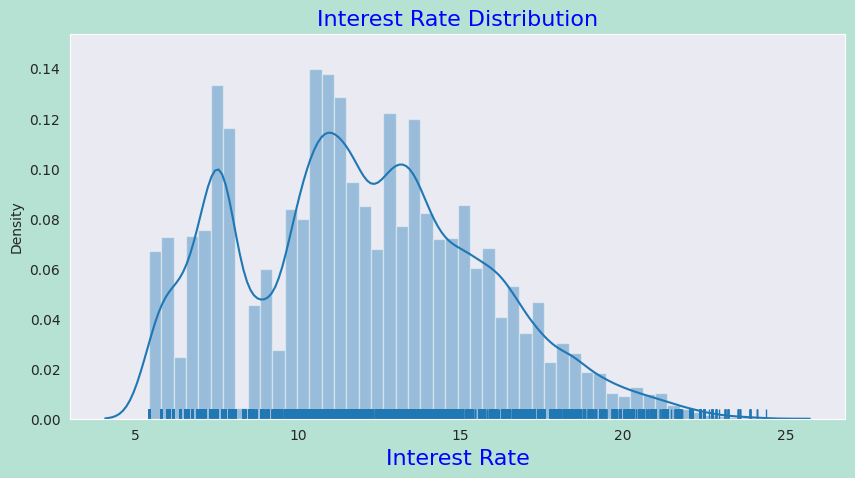

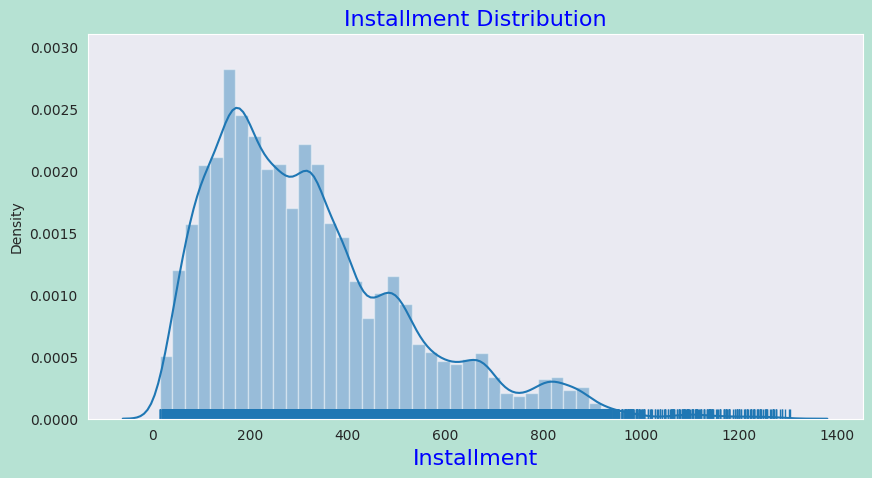

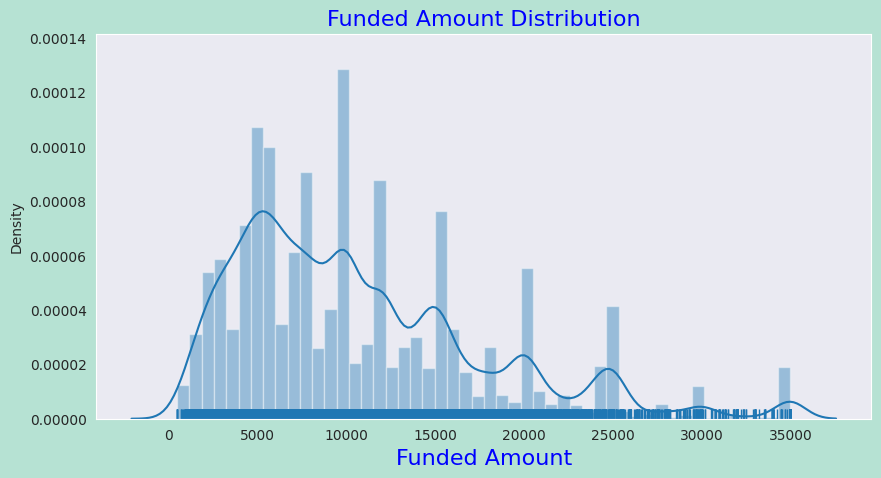

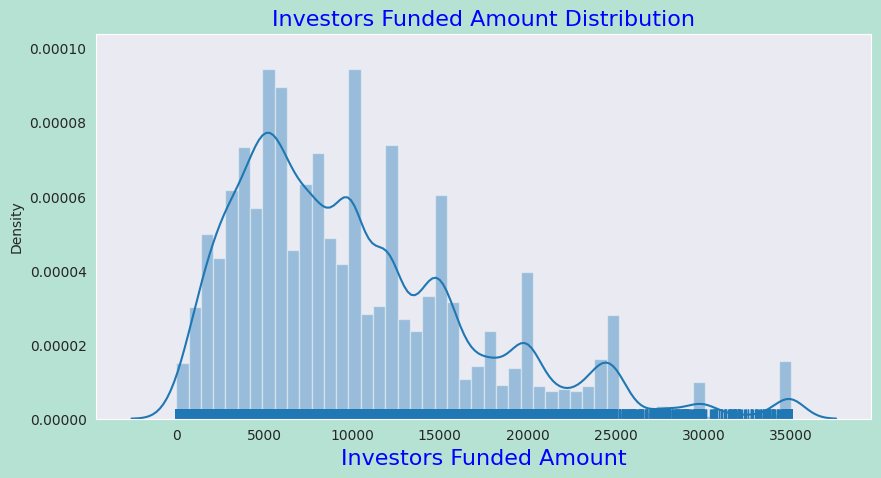

In [56]:
#plot boxplot in subplots for all continous variables

plot_density_distribution(loan_df,'annual_inc', 'Annual Income Distribution','Annual Income')
plot_density_distribution(loan_df,'loan_amnt', 'Loan Amount Distribution' , 'Loan Amount')
plot_density_distribution(loan_df,'int_rate', 'Interest Rate Distribution', 'Interest Rate')
plot_density_distribution(loan_df,'installment', 'Installment Distribution','Installment')
plot_density_distribution(loan_df,'funded_amnt', 'Funded Amount Distribution', 'Funded Amount')
plot_density_distribution(loan_df,'funded_amnt_inv', 'Investors Funded Amount Distribution','Investors Funded Amount' )




In [57]:
loan_df[[  'annual_inc' ,
    'loan_amnt',
    'int_rate' ,
    'installment',
    'funded_amnt',
    'funded_amnt_inv']].describe()

,annual_inc,loan_amnt,int_rate,installment,funded_amnt,funded_amnt_inv
count,3.857700e+04,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000
mean,6.877797e+04,11047.025430,11.932219,322.466318,10784.058506,10222.481123
std,6.421868e+04,7348.441646,3.691327,208.639215,7090.306027,7022.720644
min,4.000000e+03,500.000000,5.420000,15.690000,500.000000,0.000000
25%,4.000000e+04,5300.000000,8.940000,165.740000,5200.000000,5000.000000
50%,5.886800e+04,9600.000000,11.710000,277.860000,9550.000000,8733.440000
75%,8.200000e+04,15000.000000,14.380000,425.550000,15000.000000,14000.000000
max,6.000000e+06,35000.000000,24.400000,1305.190000,35000.000000,35000.000000


## Observations

### These observations provide insights into the distribution and characteristics 

* 📊 Loan Amount Distribution: The majority of loan amounts fall within the range of 5,300 to 15,000.
* 📊 Central Tendency of Loan Amount: The mean loan amount is 11,047, indicating the average loan size. However, the median loan amount, which is 9,600, suggests that half of the loans are below this amount.
* 📊 Loan Amount Peaks: There are noticeable spikes in loan amounts at 10,000, 15,000, 20,000, 25,000, 30,000, and 35,000, indicating popular loan sizes or possibly predefined loan options.
* 📊 Funded Amount Distribution: The majority of funded amounts range from 5,200 to 15,000. The average funded amount is 10,784, while the median funded amount is 9,550.
* 📊 Funded Amount Peaks: Similar to loan amounts, there are spikes in funded amounts at 10,000, 15,000, 20,000, 25,000, 30,000, and 35,000.
* 📊 Interest Rate Distribution: Most interest rates fall within the range of 8.9% to 14.38%. The average interest rate is 11.93%, with a median of 11.71%.
* 📊 Installment Distribution: Installment amounts are predominantly between 165.74 and 425.55. On average, installments amount to 322.48, with a median of 277.86.
* 📊 Annual Income Outliers: The box plot for annual income reveals the presence of outliers, particularly incomes exceeding 400,000. Removing these outliers could provide a clearer picture of the distribution of annual incomes and any underlying patterns.

In [58]:
def remove_outliers(df,column):
    cleaned_column_data = df[column]
    Q1 = np.percentile(df[column], 25,interpolation = 'midpoint')#First Quartile 25%
    Q3 = np.percentile(df[column], 75,interpolation = 'midpoint')#Third Quartile 75%
    IQR = Q3 - Q1 #Inter Quartile range

    if IQR > 0:
        cleaned_column_data = df[column][(df[column] > (Q1-1.5*IQR)) & (df[column] < (Q3+1.5*IQR))]#Standard formulae
        print("Removing outliers for",column)
    return cleaned_column_data

In [59]:
#remove the outliers from funded loan amount
loan_df['annual_inc'] = remove_outliers(loan_df,'annual_inc')

loan_df['annual_inc'].describe()

Removing outliers for annual_inc


count     36754.000000
mean      61079.142225
std       28040.679299
min        4000.000000
25%       40000.000000
50%       56000.000000
75%       78000.000000
max      144997.000000
Name: annual_inc, dtype: float64

### Annual income now has a Median of 56000 and most of the numbers lies between 40000 and 78000

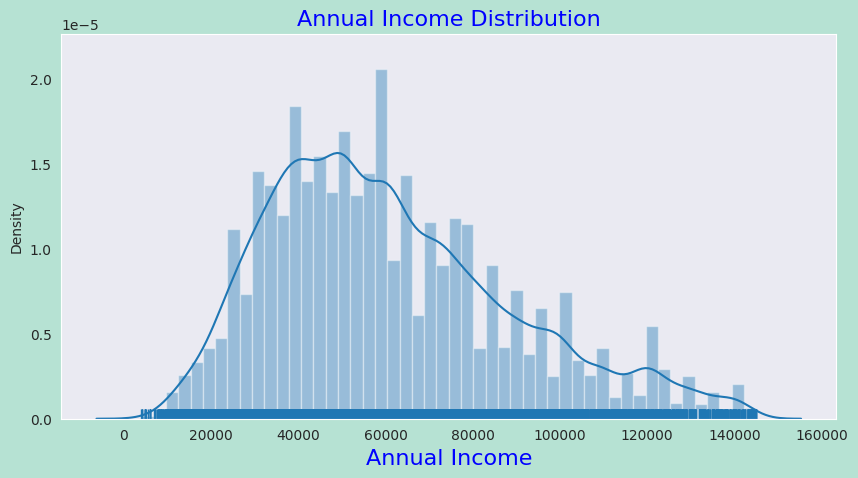

In [60]:
#desnity plot for annual income
plot_density_distribution(loan_df,'annual_inc', 'Annual Income Distribution','Annual Income')

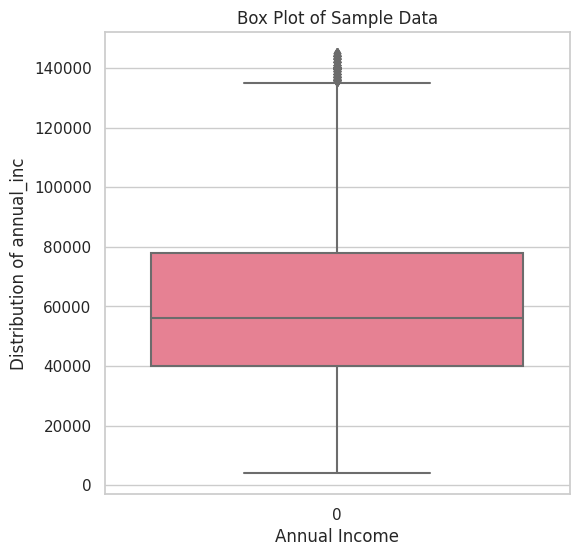

In [142]:
show_simple_boxplot(loan_df, 'annual_inc', "Annual Income")

## Univariate Analysis for Categorical Variables

In [62]:
   
# defining a function to plot single countplot

def show_countplot(df,col):
    """
    Display a countplot for a specified column in a DataFrame.

    Parameters:
        df (DataFrame): The DataFrame containing the data.
        col (str): The name of the column to visualize.

    Returns:
        None
    """
    series = pd.Series(df[col])
    plt.figure(figsize=(10,5),facecolor=Color.Dusty_Rose.value)
    sns.countplot(df[col],order=series.unique())
    plt.title("Countplot for "+col,color=Color.Navy_Blue.value)
    plt.xticks(rotation=90,color=Color.Dark_Coffee_Pot.value)
    plt.show()
    

In [63]:

# defining a function to plot multiple barplot

def show_barplot_subplots(data, figsize=(15, 8), rows=2, cols=3):
    """
    Plots multiple bar plots for each column in the given dataframe.

    Parameters:
        data (DataFrame): The dataframe containing the data.
        figsize (tuple, optional): The figure size of the plot. Defaults to (15, 8).
        rows (int, optional): The number of rows in the subplot grid. Defaults to 2.
        cols (int, optional): The number of columns in the subplot grid. Defaults to 3.

    Returns:
        matplotlib.figure.Figure: The matplotlib figure object containing the plots.
    """
    if not isinstance(rows, int) or rows <= 0:
        raise ValueError("rows must be a positive integer")
    if not isinstance(cols, int) or cols <= 0:
        raise ValueError("cols must be a positive integer")

    fig = plt.figure(figsize=figsize, facecolor=Color.Mint.value)
    
    for i, column in enumerate(list(data.keys())):
        ax = fig.add_subplot(rows, cols, i+1)
        ax.set_title(f'{column} - Distribution Plot', fontsize=10, color=Color.Blue_Grotto.value)
        
        # Count occurrences of unique values
        value_counts = data[column].value_counts()
        ax.bar(value_counts.index, value_counts.values, width=0.5, color=Color.Navy_Blue.value)
        if(value_counts.count() > 10): 
            # Rotate x-axis labels by 45 degrees
            ax.set_xticklabels(value_counts.index, fontsize=6, color=Color.Dark_Coffee_Pot.value, rotation=15)
    
    plt.tight_layout()
    return fig

In [64]:
# percentage of each category in loan status
loan_df.loan_status.value_counts(normalize=True)

loan_status
Fully Paid     0.854136
Charged Off    0.145864
Name: proportion, dtype: float64

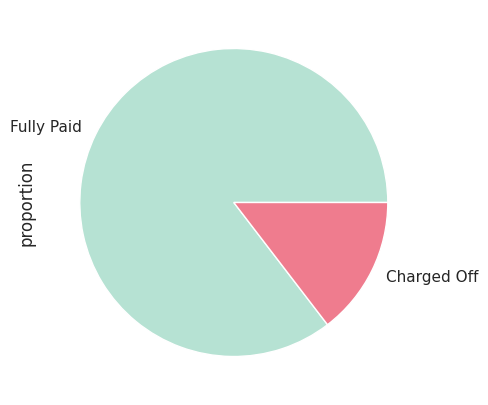

In [65]:
# pie plot for the loan status variable
plt.figure(figsize=[8,5])
colors=[Color.Spearmint.value,Color.Hot_Pink.value]
loan_df.loan_status.value_counts(normalize=True).plot.pie(colors=colors)
plt.show()

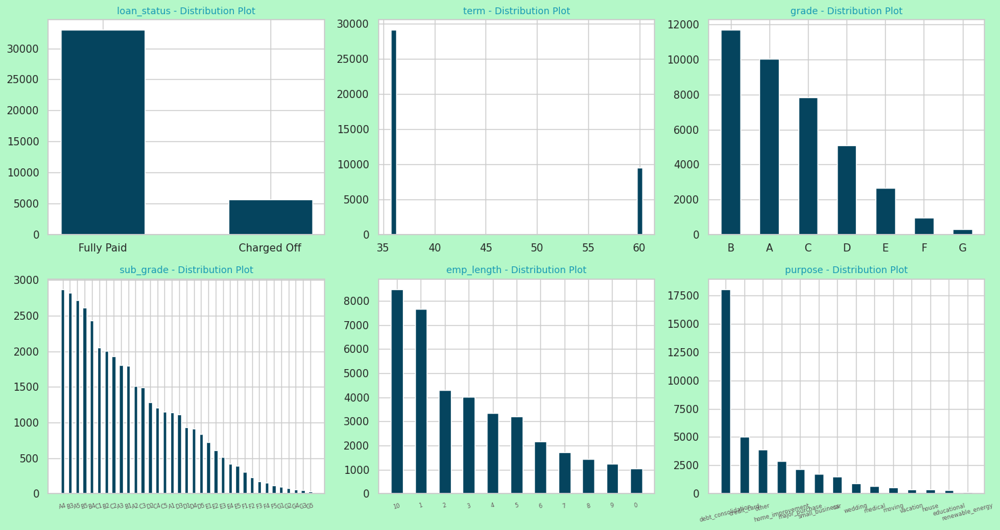

In [66]:
# barplot for most of the categorical variables

cat_data = {
    'loan_status' : loan_df['loan_status'],
    'term': loan_df['term'],
    'grade': loan_df['grade'],
    'sub_grade' : loan_df['sub_grade'],
    'emp_length' : loan_df['emp_length'],
    'purpose' : loan_df['purpose'],
}
fig = show_barplot_subplots(cat_data)

# Display the plots
plt.show()

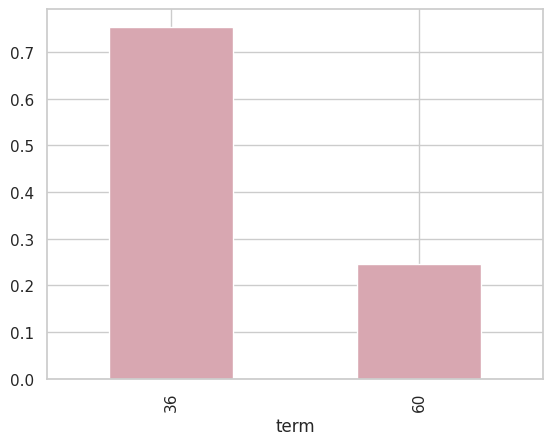

In [67]:
# plotting individual count plots where x-labels and ticks dont show
loan_df.term.value_counts(normalize=True).plot.bar(facecolor=Color.Rosewater.value)
plt.show()

The number of payments on the loan. Values are in months and can be either 36 or 60.

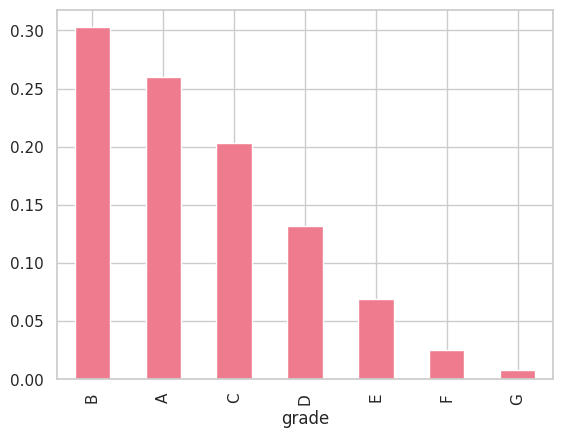

In [68]:
# plotting individual count plots where x-labels and ticks dont show
loan_df.grade.value_counts(normalize=True).plot.bar(facecolor=Color.Hot_Pink.value)
plt.show()

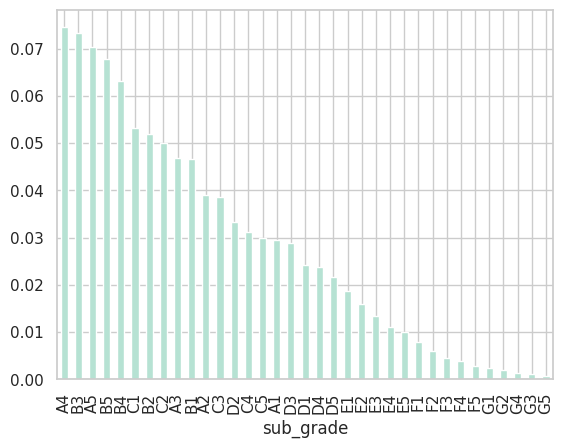

In [69]:
# plotting individual count plots where x-labels and ticks dont show
loan_df.sub_grade.value_counts(normalize=True).plot.bar(facecolor=Color.Spearmint.value)
plt.show()

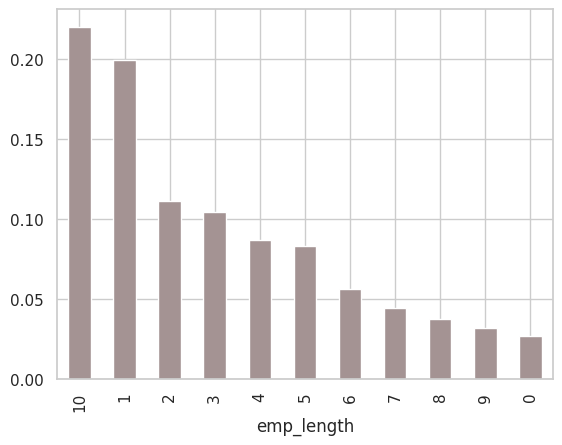

In [70]:
# plotting individual count plots where x-labels and ticks dont show
sortedData = loan_df.emp_length.sort_values()
sortedData.value_counts(normalize=True).plot.bar(facecolor=Color.Light_Coffee_Pot.value)
plt.show()

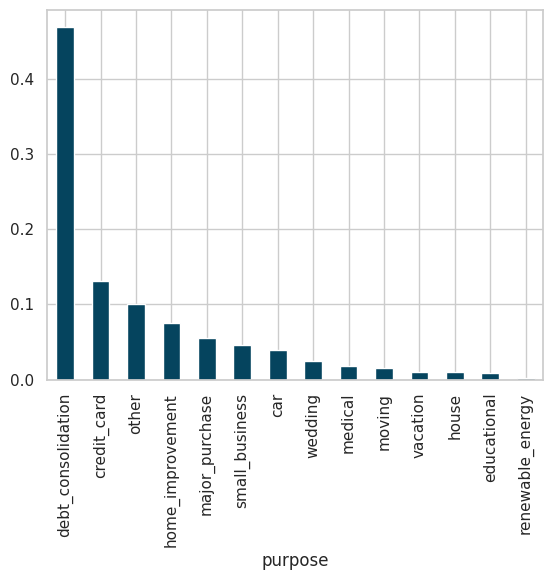

In [71]:
# plotting individual count plots where x-labels and ticks dont show
loan_df.purpose.value_counts(normalize=True).plot.bar(facecolor=Color.Navy_Blue.value)
plt.show()

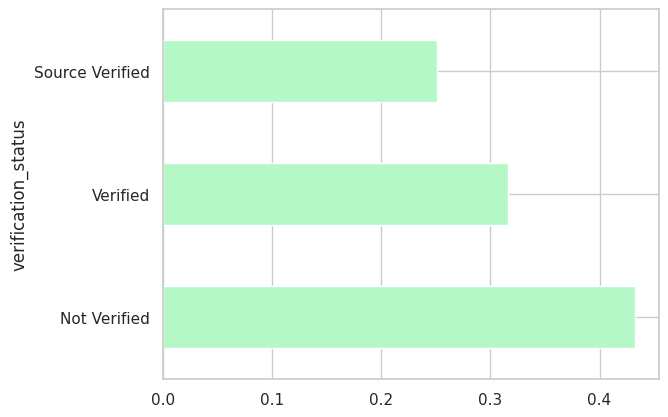

In [72]:
# barplot for verification status
loan_df.verification_status.value_counts(normalize=True).plot.barh(facecolor=Color.Mint.value)
plt.show()

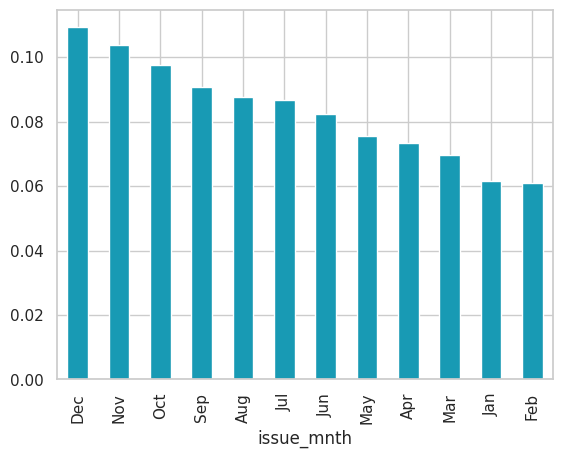

In [73]:
#barplot for issue_mnth
loan_df.issue_mnth.value_counts(normalize=True).plot.bar(facecolor=Color.Blue_Grotto.value)
plt.show()

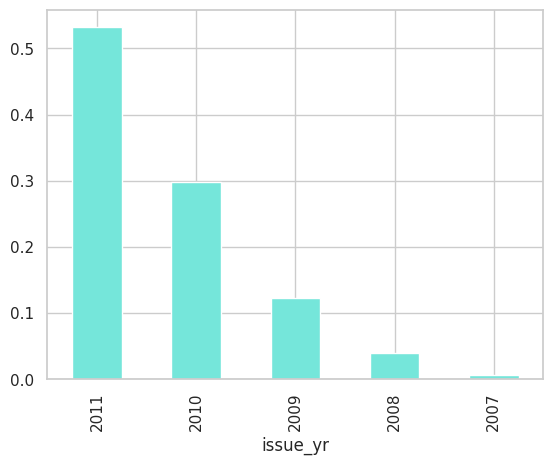

In [74]:
#barplot for issue_yr
loan_df.issue_yr.value_counts(normalize=True).plot.bar(facecolor=Color.Blue_Green.value)
plt.show()

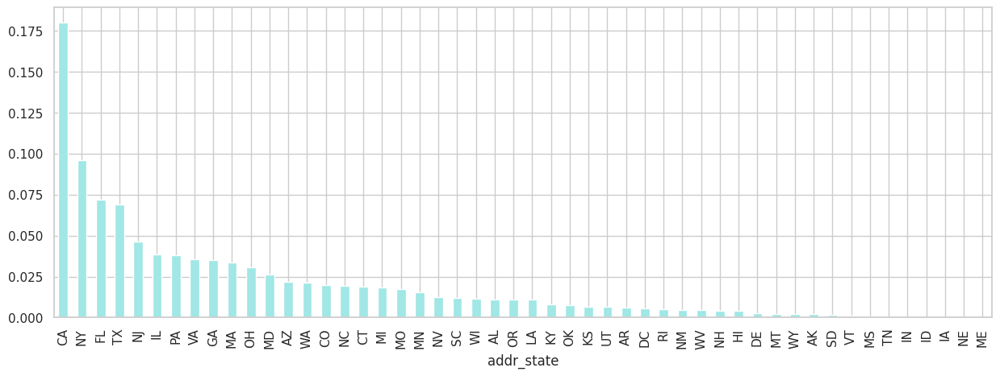

In [75]:
#barplot for issue_yr
loan_df.addr_state.value_counts(normalize=True).plot.bar(figsize=(15,5),facecolor=Color.Tiffany_Blue.value)
plt.show()

## Segmented Univariate Analysis

The process typically involves dividing the dataset into distinct segments or subsets based on a specific criterion or grouping variable. Then, an analysis is performed on each segment individually, treating them as separate univariate analyses.

Loan amount is plotted as box plot against loan_status

In [76]:

#define a function to plot grouped data against any categorical variable
# def segemented_analysis_group_and_plot(data, col1,col2,title, yLabel,figsize=(12,8)) : 
#     df_grouped = data.groupby([col1,col2])[col2].count().unstack()
#     ax = df_grouped.apply(lambda x : round(x*100/x.sum()),axis=1).plot(kind='bar', stacked=True,figsize=figsize)
#     plt.xticks(rotation=0)
#     plt.ylabel(yLabel)
#     plt.title(title)
#     plt.show()
    
def segemented_analysis_group_and_plot(data, category_col, value_col, title, ylabel, figsize=(12, 8)):
    """
    Plot grouped data against a categorical variable.

    Parameters:
    - data: DataFrame containing the data.
    - category_col: Name of the categorical variable column.
    - value_col: Name of the column containing the values to be plotted.
    - title: Title of the plot.
    - ylabel: Label for the y-axis.
    - figsize: Tuple specifying the figure size (optional).

    Returns:
    - None
    """
    grouped_data = data.groupby([category_col, value_col])[value_col].count().unstack()
    normalized_data = grouped_data.apply(lambda x: round(x * 100 / x.sum()), axis=1)
    ax = normalized_data.plot(kind='bar', stacked=True, figsize=figsize)
    
    plt.xticks(rotation=0)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.show()

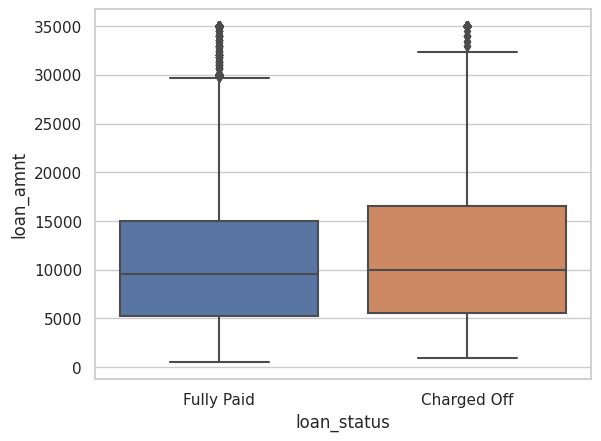

In [77]:
sns.boxplot(data=loan_df, x='loan_status', y='loan_amnt')
plt.show()

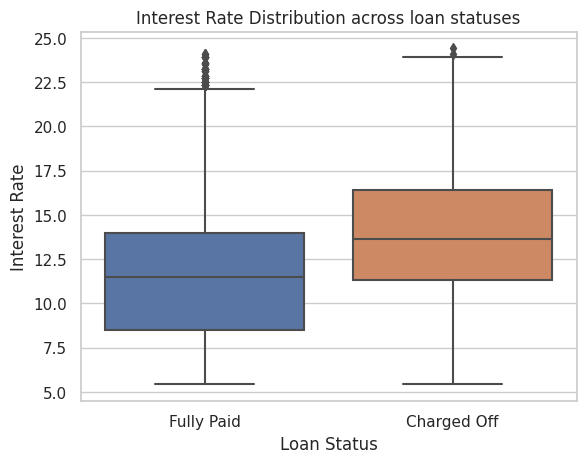

In [79]:
# Segmented Univariate analysis using int_rate
box_plot = sns.boxplot(x='loan_status',y='int_rate',data=loan_df)
plt.ylabel('Interest Rate')
plt.xlabel('Loan Status')
plt.title('Interest Rate Distribution across loan statuses')
plt.show()

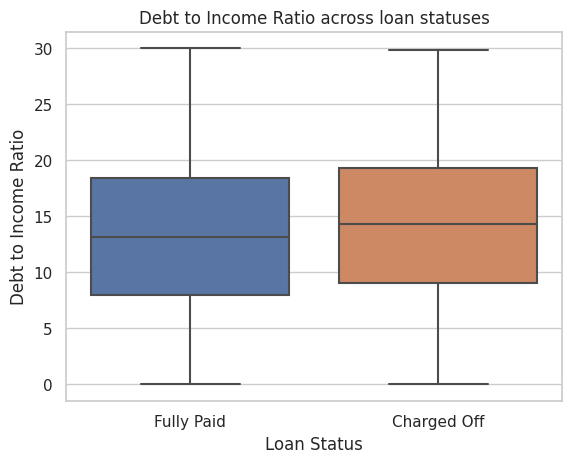

In [84]:
# Segmented Univariate analysis using dti
box_plot = sns.boxplot(x='loan_status',y='dti',data=loan_df)
plt.ylabel('Debt to Income Ratio')
plt.xlabel('Loan Status')
plt.title('Debt to Income Ratio across loan statuses')
plt.show()

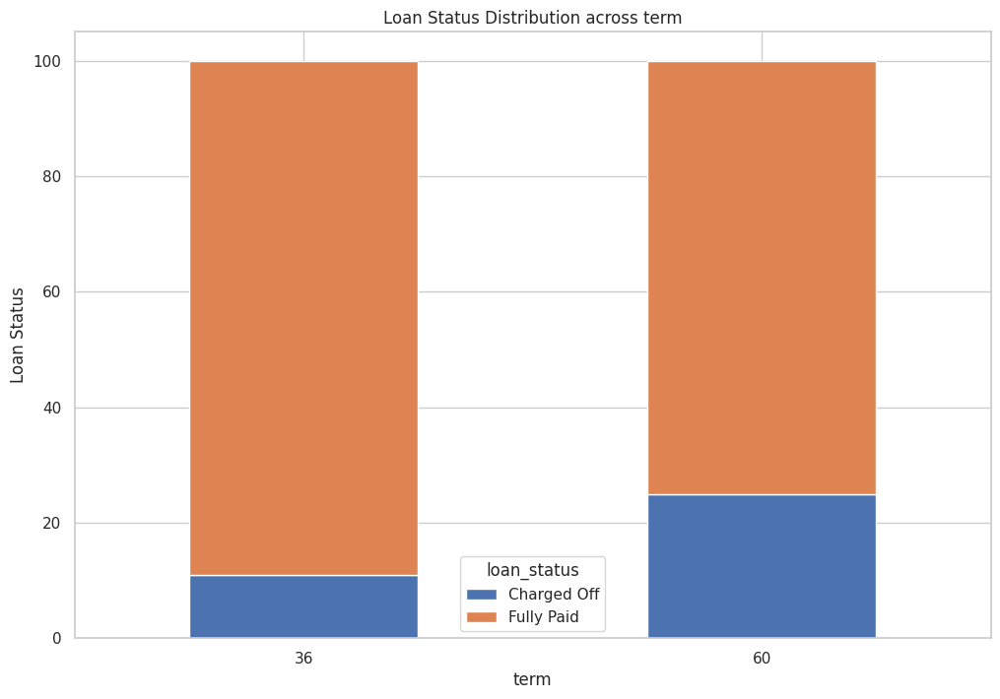

In [78]:
segemented_analysis_group_and_plot(loan_df,'term','loan_status','Loan Status Distribution across term','Loan Status')

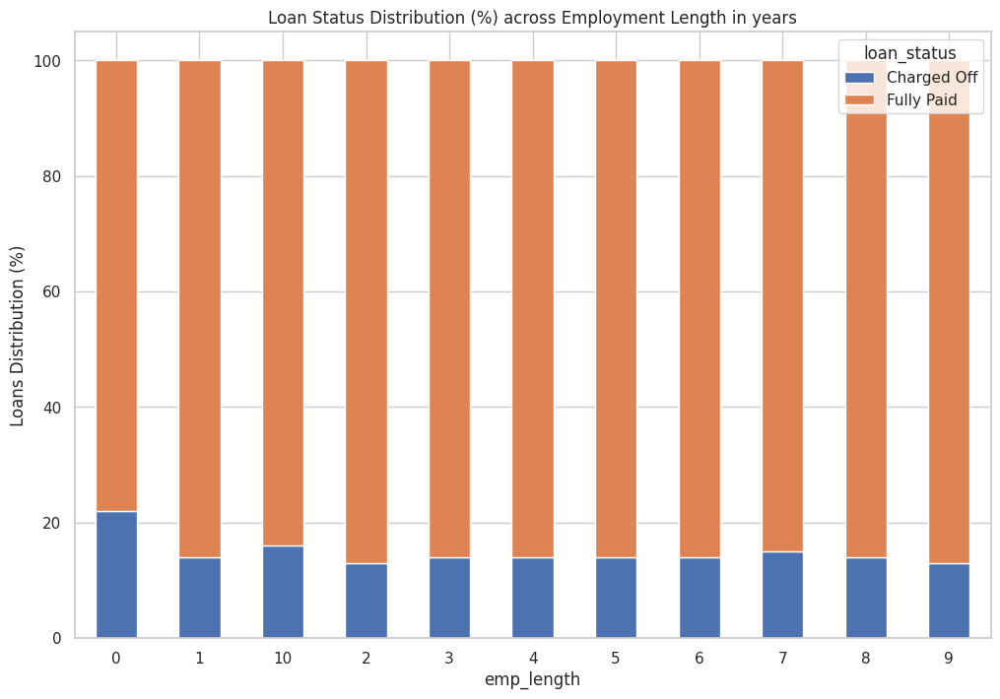

In [80]:

segemented_analysis_group_and_plot(loan_df,'emp_length', 'loan_status', 'Loan Status Distribution (%) across Employment Length in years', 'Loans Distribution (%)')

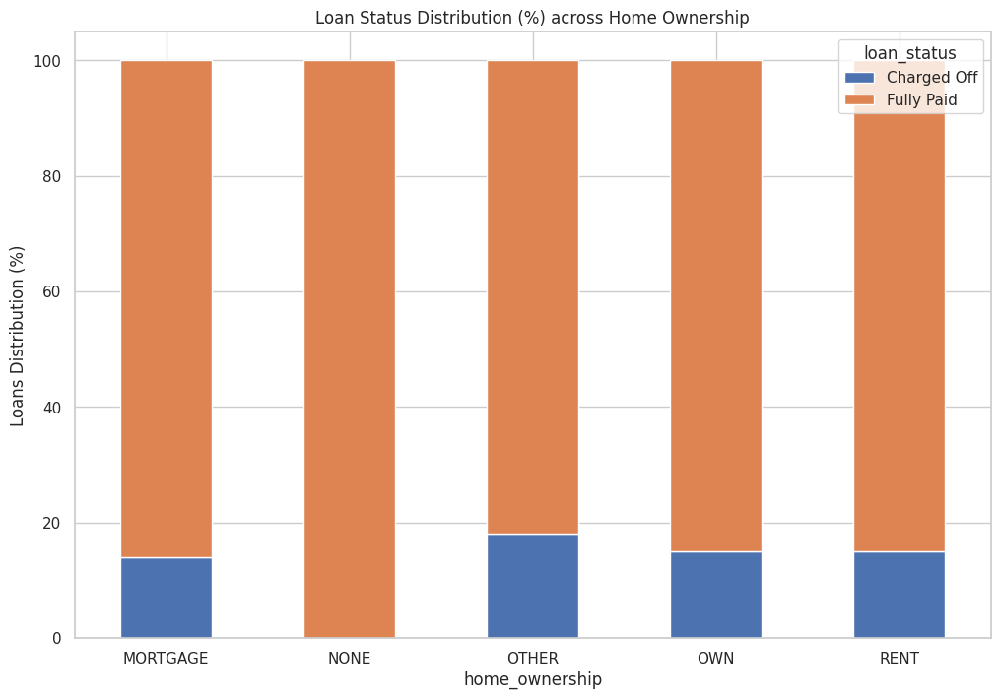

In [81]:
segemented_analysis_group_and_plot(loan_df,'home_ownership', 'loan_status', 'Loan Status Distribution (%) across Home Ownership', 'Loans Distribution (%)')

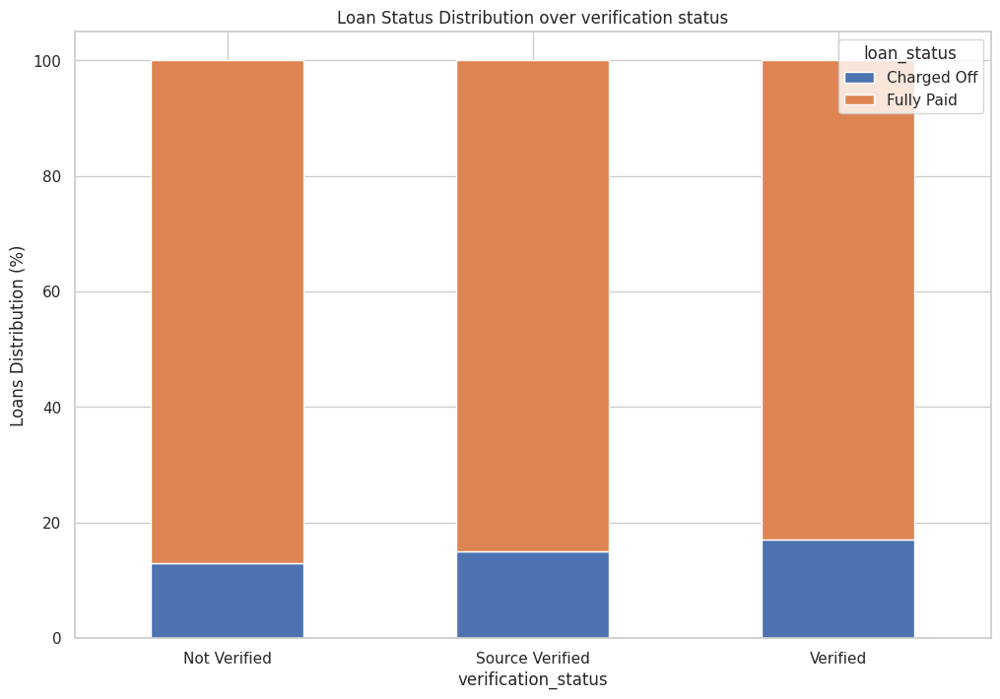

In [82]:
segemented_analysis_group_and_plot(loan_df,'verification_status', 'loan_status', 'Loan Status Distribution over verification status', 'Loans Distribution (%)')

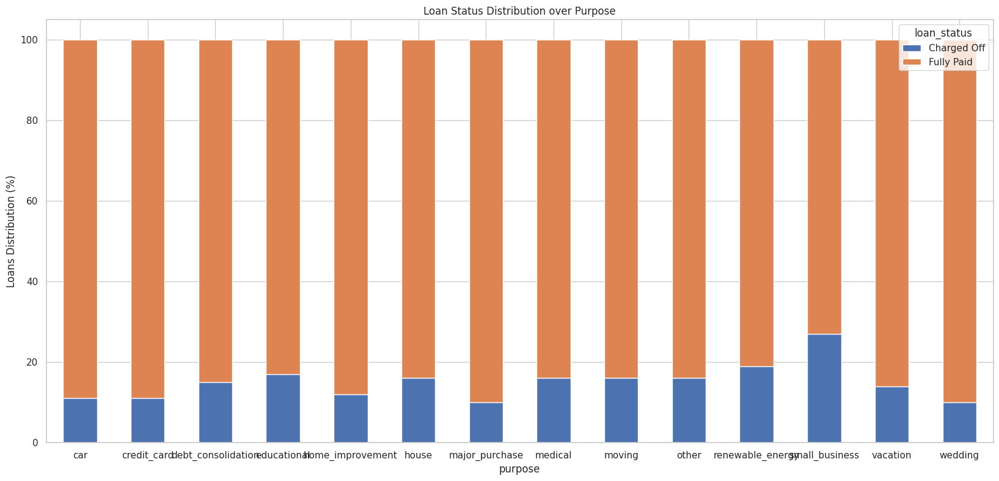

In [83]:
segemented_analysis_group_and_plot(loan_df,'purpose', 'loan_status', 'Loan Status Distribution over Purpose', 'Loans Distribution (%)', (20,9))

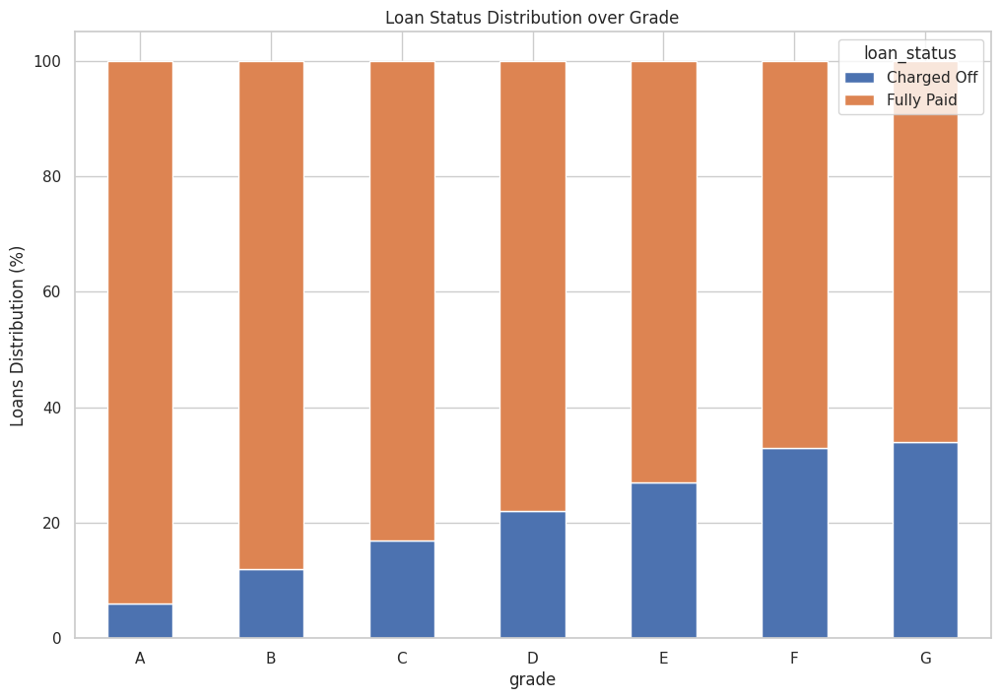

In [85]:
segemented_analysis_group_and_plot(loan_df,'grade', 'loan_status', 'Loan Status Distribution over Grade', 'Loans Distribution (%)')

## Observations

* Opting for shorter-term periods is generally preferred over longer ones.
* There's a correlation between decreasing credit grades and a reduction in the number of loans, with 'B' being the most common grade among borrowers.
* The number of loans is notably higher for individuals with over a decade of employment. Loan uptake gradually declines for those with 0 to 9 years of employment but sharply increases for those with 10+ years of experience.
* Loans are predominantly taken out for debt consolidation, credit card refinancing, home improvements, and major purchases.
* Towards the end of the year, there's a notable increase in the number of loans. Additionally, borrowers with a 60-month term are more prone to default compared to those with a 36-month term.
* Certain states like CA, FL, NY, and NI exhibit a higher number of loan applications.
* Borrowers with 'Other' home ownership tend to default more frequently compared to other categories. It's intriguing to note that 'None' as a home ownership category has no defaulters.
* Borrowers with employment lengths of 10+ years or no specified employment tend to default more frequently than others.
* Grades E, F, and G are associated with a higher likelihood of default, which correlates with higher interest rates.
* Borrowers with higher funded amounts are more prone to default compared to those with lower amounts.

## Bivariate Analysis

## We will try to analyse two numerical variables and then a numerical variable vs categorical variable

In [86]:
edited_num_cols

['id',
 'loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'int_rate',
 'installment',
 'annual_inc',
 'dti',
 'mths_since_last_delinq',
 'open_acc',
 'revol_bal',
 'total_acc',
 'total_pymnt',
 'total_pymnt_inv',
 'total_rec_prncp',
 'total_rec_int',
 'last_pymnt_amnt',
 'funded_amnt_bal']

Plotting loan amount against interest rate to see how one affects the other

Plotting loan amount against annual income to see how one affects the other## Numerical vs Numerical analysis

### Bivariate analysis between "loan_amnt" and "int_rate", "loan_amnt" and "dti", and "loan_amnt" and "installment":

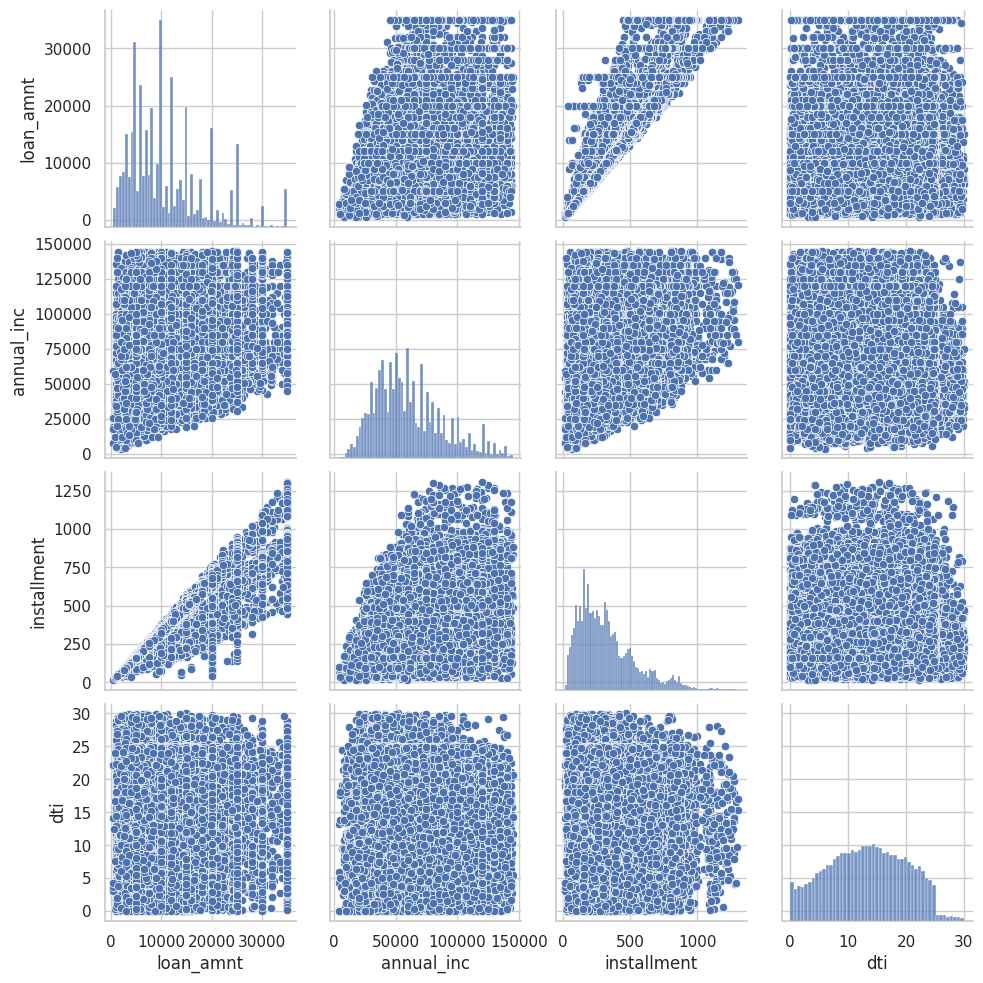

In [87]:
#pair plot of loan amount, annual income, installment and debt to income ratio
sns.pairplot(loan_df[["loan_amnt", "annual_inc", "installment", "dti"]])
plt.show()

# Util function to create a subplots of scatter plot:

In [88]:
# Util function to create a subplots of scatter plot:

def show_scatter_subplots(data, x_column, y_columns, hue_column='',hue_order=None,figsize=(15, 15), facecolor= Color.Spearmint.value, rows=1, cols=1):
    """
    Display subplots of scatter plots.

    Args:
        data (DataFrame): The DataFrame containing the data.
        x_column (str): The column name for the x-axis.
        y_columns (list of str): The list of column names for the y-axis.
        hue_column (str): The column name for the hue (optional).
        hue_order (str): The hue order value (optional).
        figsize (tuple): The figure size. Default is (15, 15).
        facecolor (tuple): The face color of the plot. Default is Color.Spearmint.
        rows (int): Number of rows for subplots grid. Default is 1.
        cols (int): Number of columns for subplots grid. Default is 1.

    Raises:
        ValueError: If the number of subplots exceeds available space.

    Returns:
        None
    """
    plt.figure(figsize=figsize, facecolor=facecolor)
    sns.set_style("dark")
    
    num_plots = len(y_columns)
    
    if num_plots > rows * cols:
        raise ValueError("Number of subplots exceeds available space")
    
    for i, y_column in enumerate(y_columns):
        print(f'Plotting {x_column} vs {y_column}')
        
        # Create a new subplot
        plt.subplot(rows, cols, i+1)

        # Optional hue_column added to introdue a categorical column to other obeservatins
        if hue_column:
            sns.scatterplot(data=data, x=x_column, y=y_column, hue=hue_column, hue_order=hue_order)
        else:
            sns.scatterplot(data=data, x=x_column, y=y_column)

        
        # Set the plot title
        plt.title(f'{x_column} vs {y_column}')
        
        # Set the axis labels
        plt.xlabel(x_column)
        plt.ylabel(y_column)
     
    # Adjust the layout
    plt.tight_layout()
    
    # Show the plot
    plt.show()




In [146]:
data = {
    'loan_amnt': loan_df['loan_amnt'],
    'int_rate': loan_df['int_rate'],
    'installment': loan_df['installment'],
    'dti': loan_df['dti'],
    'annual_inc': loan_df['annual_inc'],
    'grade': loan_df['grade'], # optional column for adding hue
    'loan_status': loan_df['loan_status'], # optional column for adding hue
    'verification_status': loan_df['verification_status'], # optional column for adding hue
    'purpose': loan_df['purpose'], # optional column for adding hue
    'home_ownership': loan_df['home_ownership'], # optional column for adding hue
    'term': loan_df['term'], # optional column for adding hue
}

Plotting loan_amnt vs int_rate
Plotting loan_amnt vs annual_inc
Plotting loan_amnt vs installment
Plotting loan_amnt vs dti


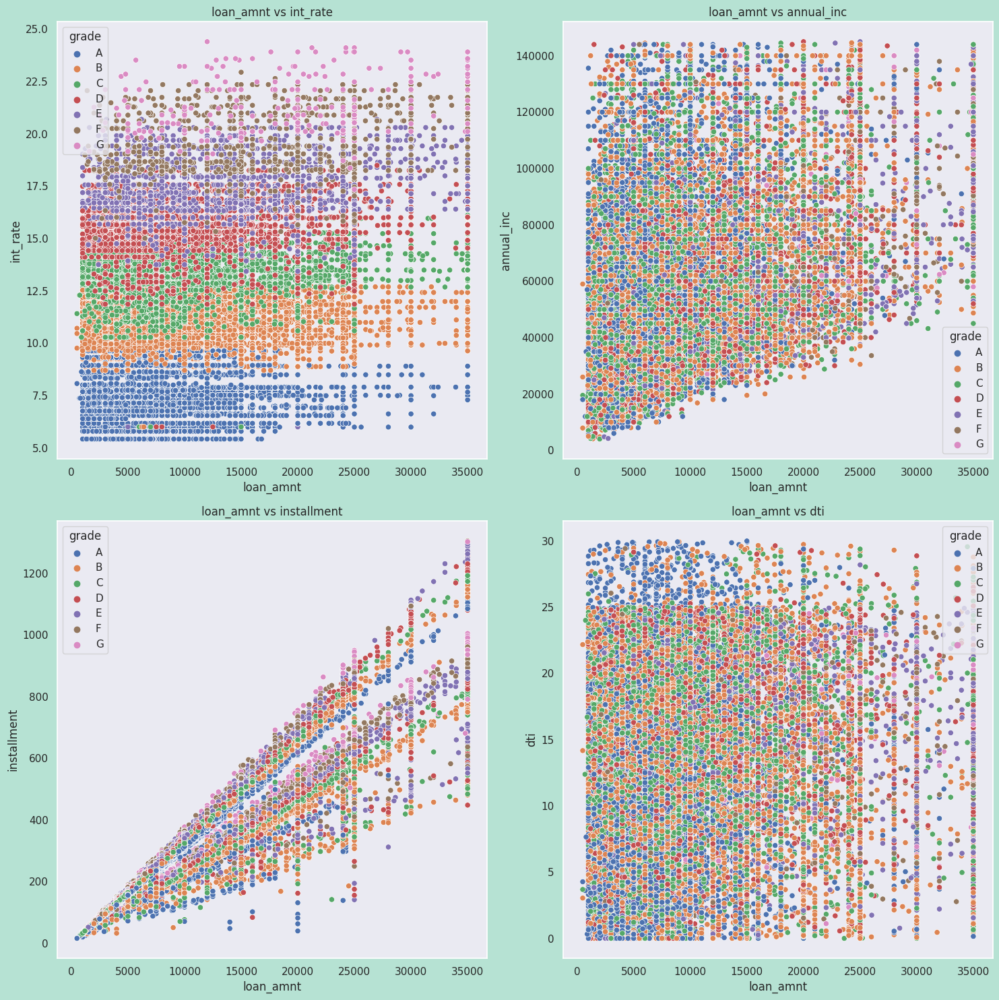

In [90]:


x_column = 'loan_amnt'
y_columns = ['int_rate', 'annual_inc', 'installment', 'dti' ]

show_scatter_subplots(data, x_column, y_columns,hue_column='grade',hue_order='ABCDEFG', rows=2, cols=2 )

Plotting annual_inc vs int_rate
Plotting annual_inc vs loan_amnt
Plotting annual_inc vs installment
Plotting annual_inc vs dti


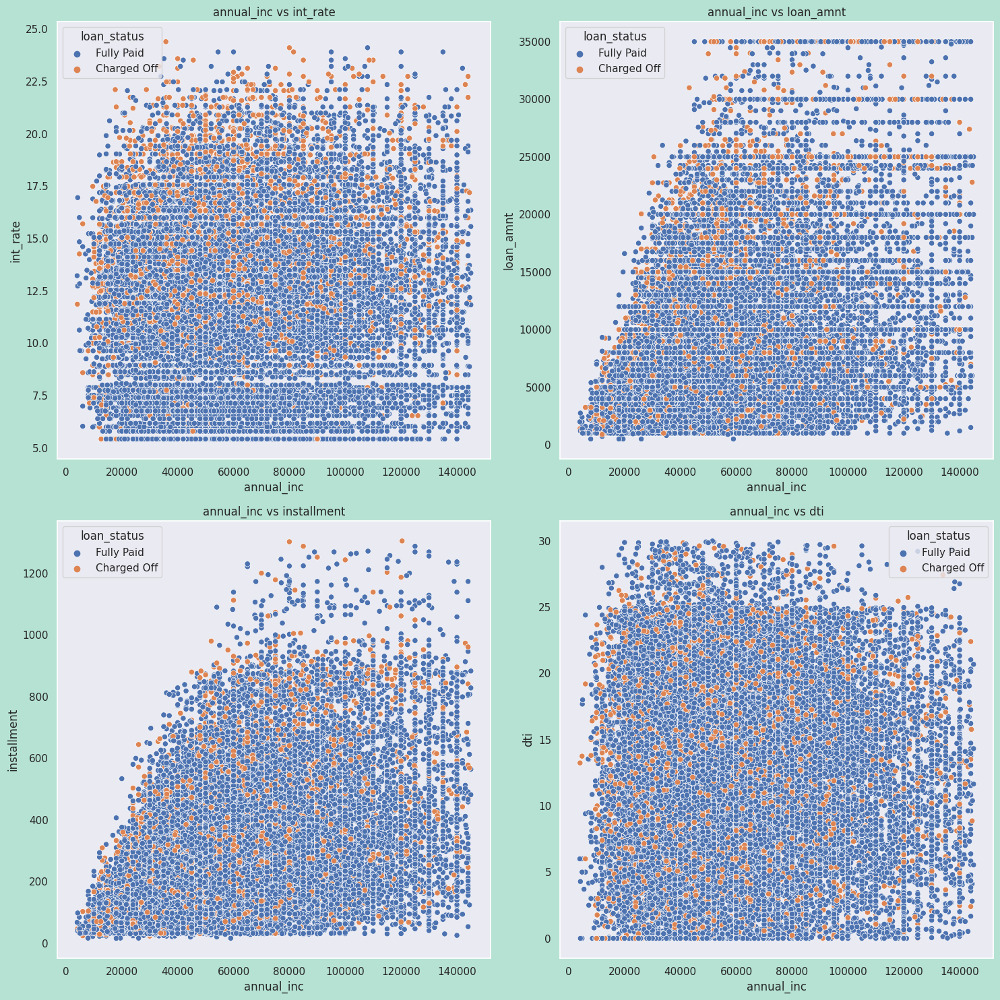

In [143]:
x_column = 'annual_inc'
y_columns = ['int_rate', 'loan_amnt', 'installment', 'dti' ]

show_scatter_subplots(data, x_column, y_columns,hue_column='loan_status', rows=2, cols=2)

Plotting annual_inc vs int_rate
Plotting annual_inc vs loan_amnt
Plotting annual_inc vs installment
Plotting annual_inc vs dti


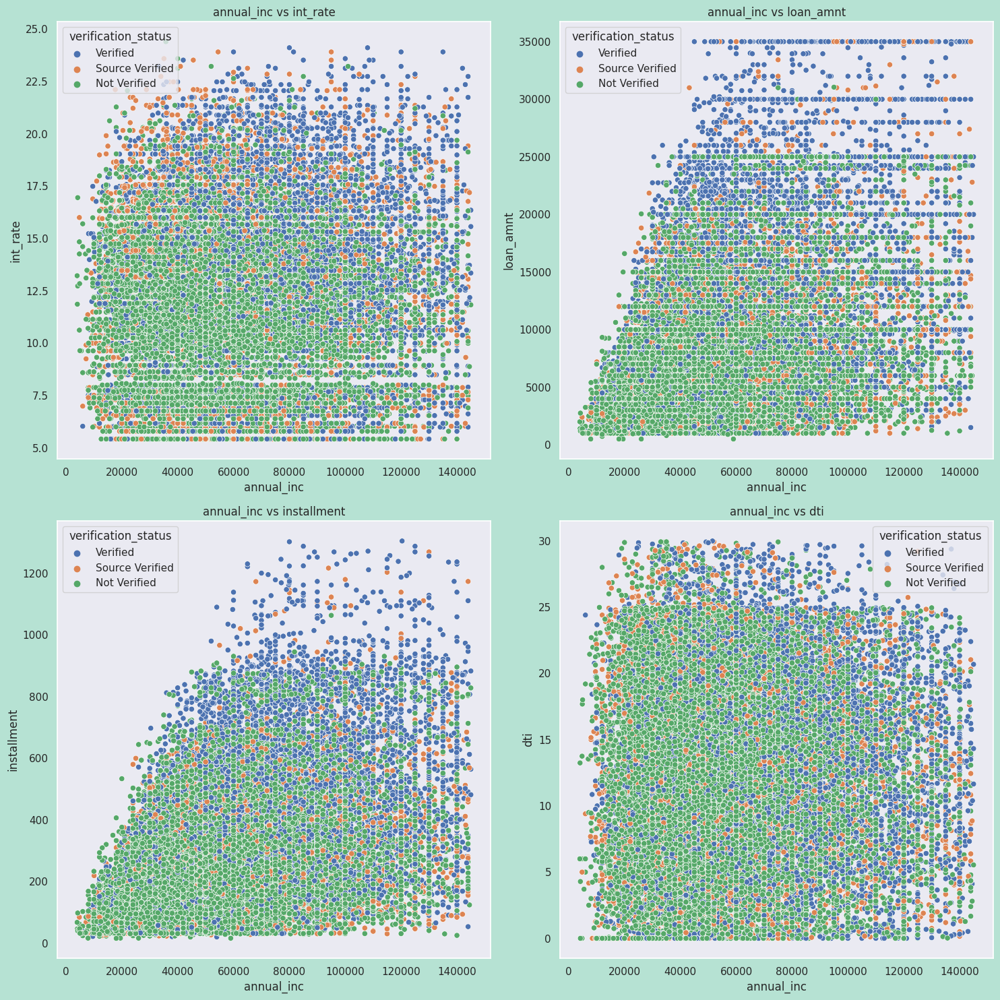

In [145]:
x_column = 'annual_inc'
y_columns = ['int_rate', 'loan_amnt', 'installment', 'dti' ]

show_scatter_subplots(data, x_column, y_columns,hue_column='verification_status', rows=2, cols=2)

Plotting annual_inc vs int_rate
Plotting annual_inc vs loan_amnt
Plotting annual_inc vs installment
Plotting annual_inc vs dti


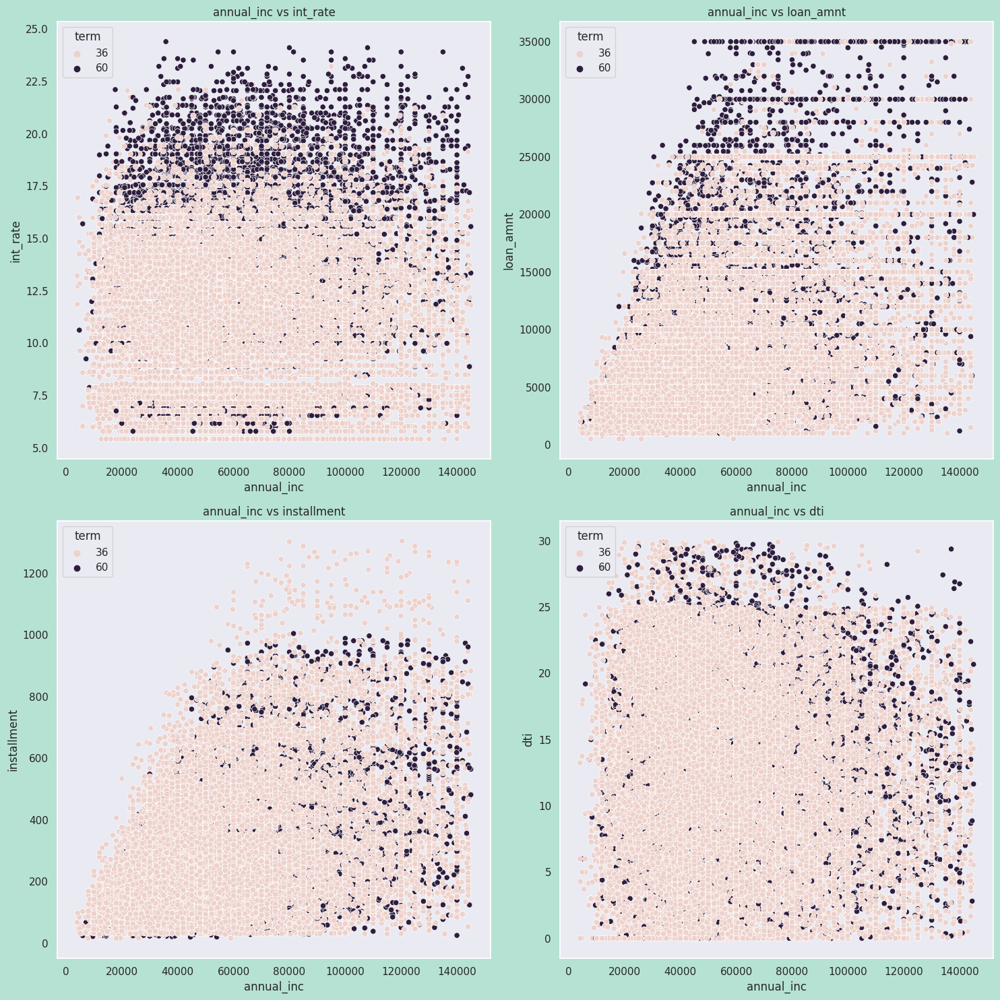

In [147]:
x_column = 'annual_inc'
y_columns = ['int_rate', 'loan_amnt', 'installment', 'dti' ]

show_scatter_subplots(data, x_column, y_columns,hue_column='term', rows=2, cols=2)

Plotting annual_inc vs int_rate
Plotting annual_inc vs loan_amnt
Plotting annual_inc vs installment
Plotting annual_inc vs dti


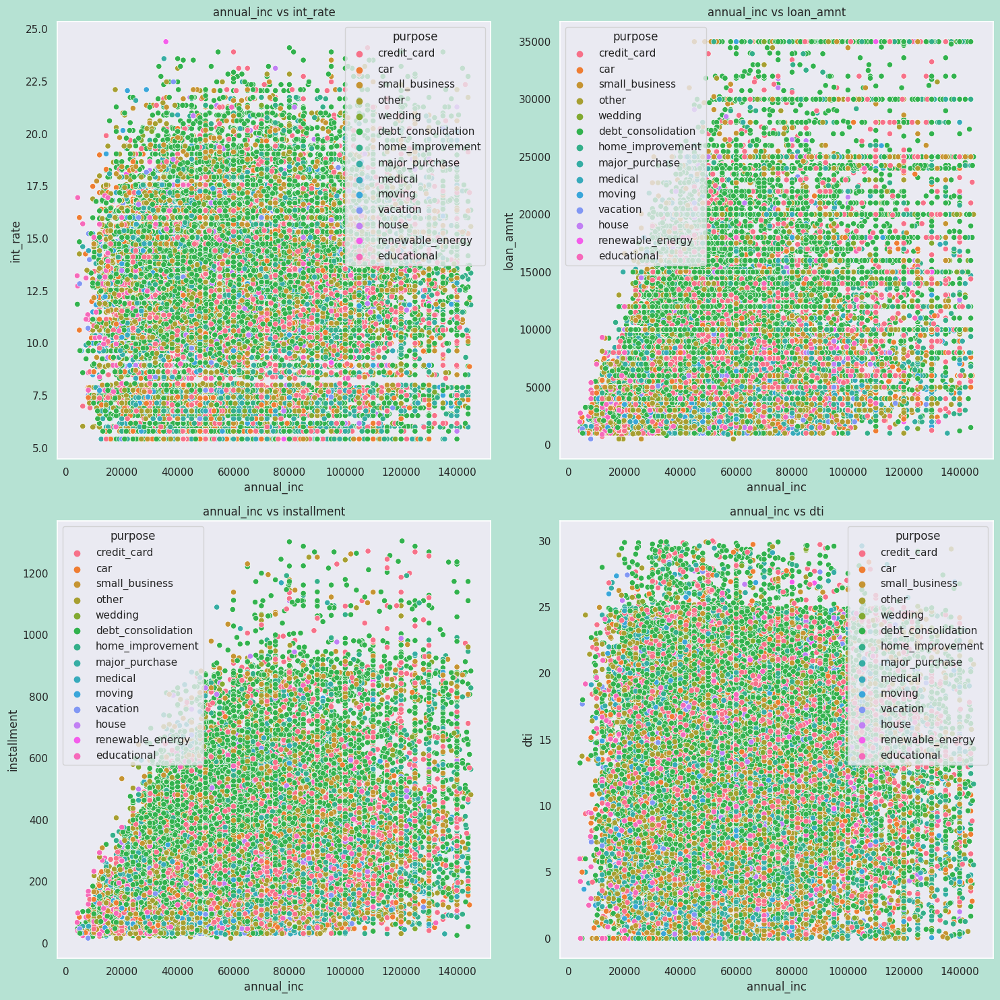

In [148]:
x_column = 'annual_inc'
y_columns = ['int_rate', 'loan_amnt', 'installment', 'dti' ]

show_scatter_subplots(data, x_column, y_columns,hue_column='purpose', rows=2, cols=2)

## Observation

* While scatter plots offer some insight, extracting clear analysis from them can be challenging. For instance, it may be observed that loan amounts tend to be lower for individuals with lower annual incomes, or for smaller loan amounts, the prevailing interest rates also tend to be lower.
* Therefore, to gain a deeper understanding, it would be beneficial to visualize the correlation among the numerical variables.




## Let us use loan amount, annual income, installment and debt to income ratio to create a correlation matrix

In [92]:
# correlation matrix of loan amount, annual income, installment and debt to income ratio
loan_df_corr = loan_df[["loan_amnt", "funded_amnt","funded_amnt_inv","annual_inc", "installment", "dti"]].corr()

Let us plot a heat map with the matrix

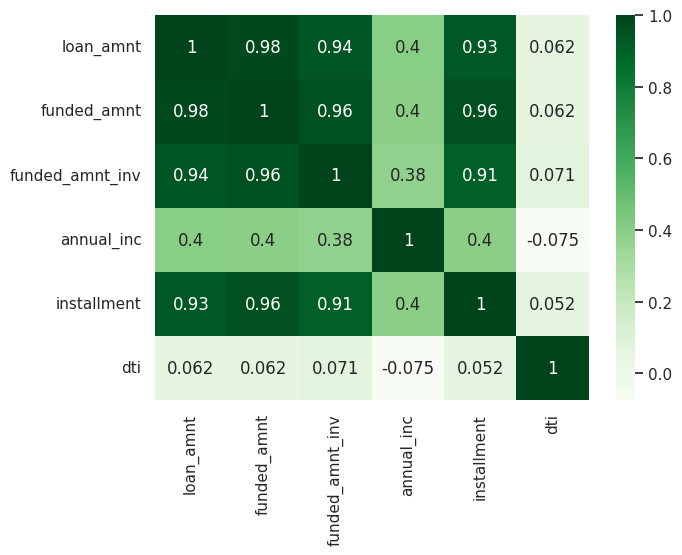

In [93]:
#heatmap of loan amount, annual income, installment and debt to income ratio
plt.figure(figsize=[7,5])
sns.heatmap(loan_df_corr, annot=True, cmap='Greens')
plt.show()

* From the preceding data, it's evident that the loan amount positively correlates with annual income.
* Annual income and loan amount both exhibit a positive correlation with Installment. In other words, as the loan amount increases, so do the installments. Individuals with higher incomes are more capable of making timely payments.
* The rise in debt-to-income ratio with annual income implies that individuals with higher incomes are at a lower risk of defaulting.
* During this period, individuals with higher annual incomes opted for larger loan amounts and were less prone to defaulting.







## Bivariate Analysis of numerical/categorical vs categorical

Objective: Our aim is to assess the loan status concerning significant columns that potentially influenced loan defaults. This analysis will enhance our ability to predict whether future borrowers should receive loans.

Now, let's determine the proportion of charged-off loans within specific categories. To achieve this, we'll undertake the following steps:

Column Derivation: Create additional columns for analysis.

1. Derive some columns for analysis

In [94]:
# Derived columns

# convert continuous loan amounts into buckets/categories which will help in analysis further in bivariate analysis.
loan_df['loan_amnt_category'] = pd.cut(loan_df['loan_amnt'], [0, 5000, 10000, 15000, 20000, 25000,30000,35000], labels=['0-5000', '5000-10000', '10000-15000', '15000-20000', '20000-25000','25000-30000','30000-35000'])

# categorise continuous annual incomes into buckets/categories which will help in analysis further in bivariate analysis.
loan_df['annual_inc_category'] = pd.cut(loan_df['annual_inc'], [0, 20000, 40000, 60000, 80000,1000000], labels=['0-20000', '20000-40000', '40000-60000', '60000-80000', '80000 +'])

# categorise continuous interest rates into buckets/categories which will help in analysis further in bivariate analysis.
loan_df['int_rate_category'] = pd.cut(loan_df['int_rate'], [0, 10, 12.5, 16, 20], labels=['0-10', '10-13', '12.5-16', '16 +'])

# categorise continuous dti into buckets/categories for bivariate analysis.
loan_df['dti_category'] = pd.cut(loan_df['dti'], [0, 5, 10, 15, 20, 25], labels=['0-5', '05-10', '10-15', '15-20', '25+'])

2. Group loans by different variables and loan status, get the count,use .unstack() to return a DataFrame

In [95]:
#define a function to calculate percentage of chargedoff for a column
def get_percentage(df,col):
    return df[df.loan_status == 'Charged Off'][col].value_counts()/df[col].value_counts()*100

In [96]:
#calculate this proportion for loan amount
get_percentage(loan_df,'annual_inc')

annual_inc
4000.0             NaN
4080.0      100.000000
4200.0             NaN
4800.0       25.000000
4888.0             NaN
               ...    
144240.0    100.000000
144500.0     33.333333
144600.0           NaN
144996.0           NaN
144997.0           NaN
Name: count, Length: 4817, dtype: float64

## util function for grouping loan status for given column, and also calculating the chargedOff proporting for each bin and total

In [97]:
#util function for grouping loan status for given column, and also calculating the chargedOff proporting for each bin and total 
def generate_df_using_proportion_of_chargedoff(df, col1, col2='loan_status'):
    temp_df = df.groupby([col1, col2]).loan_status.count().unstack().fillna(0).reset_index()
    temp_df['Total'] = temp_df['Charged Off'] + temp_df['Fully Paid'] 
    temp_df['Proportion_Chargedoff'] = temp_df['Charged Off'] / temp_df['Total'] 
    return temp_df.sort_values('Proportion_Chargedoff', ascending=False)

### Util function to plot bar horizontal plot to analyse above further with categorical value

In [98]:
#Util function to plot bar plot to analyse above further
def show_barh_categorical(data, category_column, value_column, title, x_label, y_label, size=(12, 8), plot_color='rainbow', title_color='green', label_color='blue'):
    """
    Plot a horizontal bar chart for categorical data.

    Parameters:
    - data: DataFrame containing the data to be plotted.
    - category_column: Name of the categorical column.
    - value_column: Name of the column representing the values.
    - title: Title of the plot.
    - x_label: Label for the x-axis.
    - y_label: Label for the y-axis.
    - size: Size of the plot (width, height).
    - plot_color: Color of the bars in the plot.
    - title_color: Color of the title text.
    - label_color: Color of the axis labels.

    Returns:
    - None
    """
    plt.figure(figsize=size, facecolor='#d8d7c6')
    sns.set(style='whitegrid')
    ax = sns.barplot(x=value_column, y=category_column, data=data, palette=plot_color)
    ax.set_title(title, fontsize=15, color=title_color)
    ax.set_xlabel(x_label, fontsize=14, color=label_color)
    ax.set_ylabel(y_label, fontsize=14, color=label_color)
    plt.show()

### Util function to plot bar plot to analyse above further with categorical value

In [99]:
#Util function to plot bar plot to analyse above further
def show_bar_categorical(data, value_column, category_column, title, x_label, y_label, size=(12, 8), plot_color='rainbow', title_color='red', label_color='green'):
    """
    Plot a horizontal bar chart for categorical data.

    Parameters:
    - data: DataFrame containing the data to be plotted.
    - category_column: Name of the categorical column.
    - value_column: Name of the column representing the values.
    - title: Title of the plot.
    - x_label: Label for the x-axis.
    - y_label: Label for the y-axis.
    - size: Size of the plot (width, height).
    - plot_color: Color of the bars in the plot.
    - title_color: Color of the title text.
    - label_color: Color of the axis labels.

    Returns:
    - None
    """
    plt.figure(figsize=size, facecolor='#fed9a6')
    sns.set(style='whitegrid')
    ax = sns.barplot(x=value_column, y=category_column, data=data, palette=plot_color)
    ax.set_title(title, fontsize=15, color=title_color)
    ax.set_xlabel(x_label, fontsize=14, color=label_color)
    ax.set_ylabel(y_label, fontsize=14, color=label_color)
    plt.show()

### Bivariate Analysis on annual_inc_category vs Proportion_Chargedoff

In [100]:
#grouping loan status for all annual income bins, and calculating the chargedOff proporting for each category and total  

annual_inc_range_vs_loan = generate_df_using_proportion_of_chargedoff(loan_df,'annual_inc_category')
annual_inc_range_vs_loan

loan_status,annual_inc_category,Charged Off,Fully Paid,Total,Proportion_Chargedoff
0,0-20000,237,943,1180,0.200847
1,20000-40000,1514,7004,8518,0.177741
2,40000-60000,1729,9534,11263,0.153511
3,60000-80000,1024,6597,7621,0.134366
4,80000 +,925,7247,8172,0.113191


Plot with bar plot

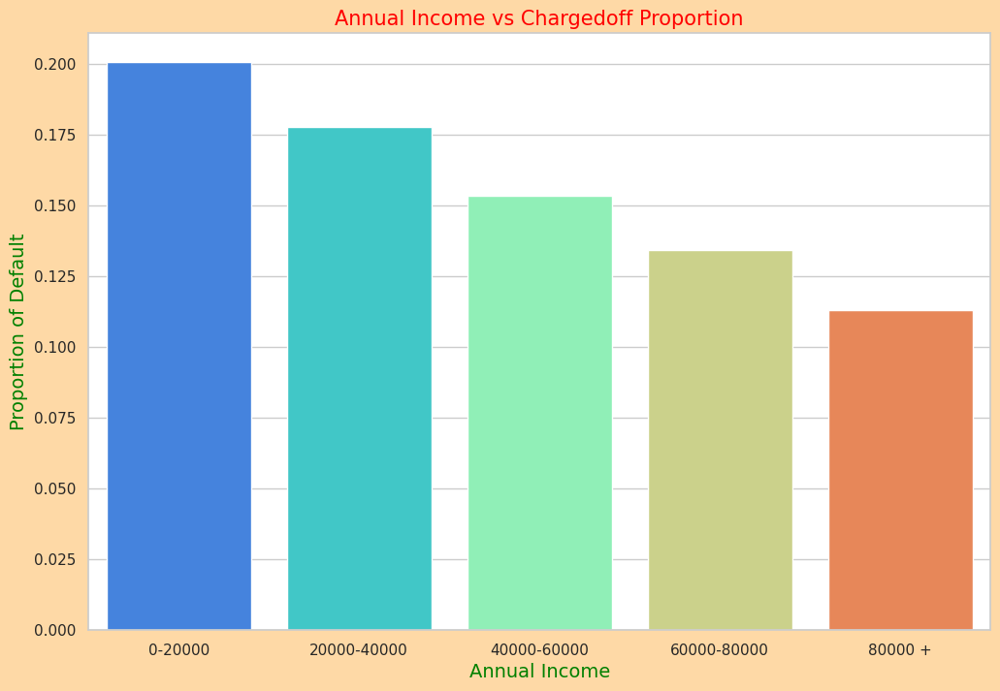

In [101]:
#lets plot a graph of annual income to the defaulting proportion
show_bar_categorical(annual_inc_range_vs_loan,'annual_inc_category','Proportion_Chargedoff','Annual Income vs Chargedoff Proportion','Annual Income','Proportion of Default')

### Bivariate Analysis on purpose vs Proportion_Chargedoff

In [102]:
#grouping loan status for all purposes, calculating the chargedOff proporting for each bin and total 
loan_purpose_vs_status = generate_df_using_proportion_of_chargedoff(loan_df,'purpose')
loan_purpose_vs_status

loan_status,purpose,Charged Off,Fully Paid,Total,Proportion_Chargedoff
11,small_business,475,1279,1754,0.270810
10,renewable_energy,19,83,102,0.186275
3,educational,56,269,325,0.172308
9,other,633,3232,3865,0.163777
5,house,59,308,367,0.160763
8,moving,92,484,576,0.159722
7,medical,106,575,681,0.155653
2,debt_consolidation,2767,15288,18055,0.153254
12,vacation,53,322,375,0.141333
4,home_improvement,347,2528,2875,0.120696


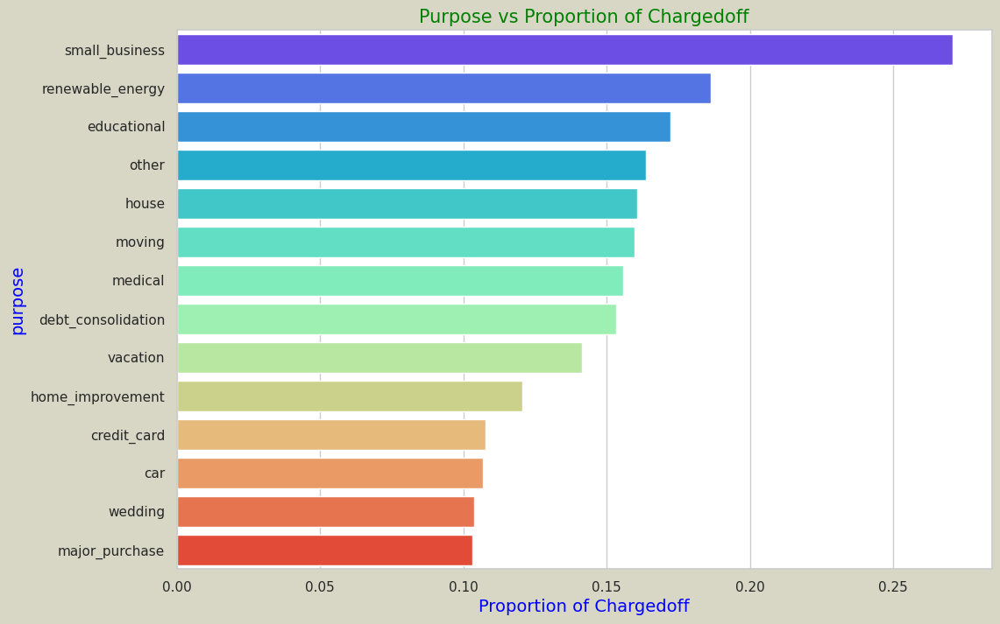

In [103]:
#lets plot the bar for grade against loan_status
show_barh_categorical(loan_purpose_vs_status,'purpose','Proportion_Chargedoff','Purpose vs Proportion of Chargedoff','Proportion of Chargedoff','purpose')

# Bivariate Analysis on grade vs Chargedoff_Proportion

In [104]:
# Bivariate Analysis on grade vs Chargedoff_Proportion
credit_grade_vs_status = generate_df_using_proportion_of_chargedoff(loan_df,'grade')
credit_grade_vs_status

loan_status,grade,Charged Off,Fully Paid,Total,Proportion_Chargedoff
6,G,101,198,299,0.337793
5,F,319,657,976,0.326844
4,E,715,1948,2663,0.268494
3,D,1118,3967,5085,0.219862
2,C,1347,6487,7834,0.171943
1,B,1425,10250,11675,0.122056
0,A,602,9443,10045,0.059930


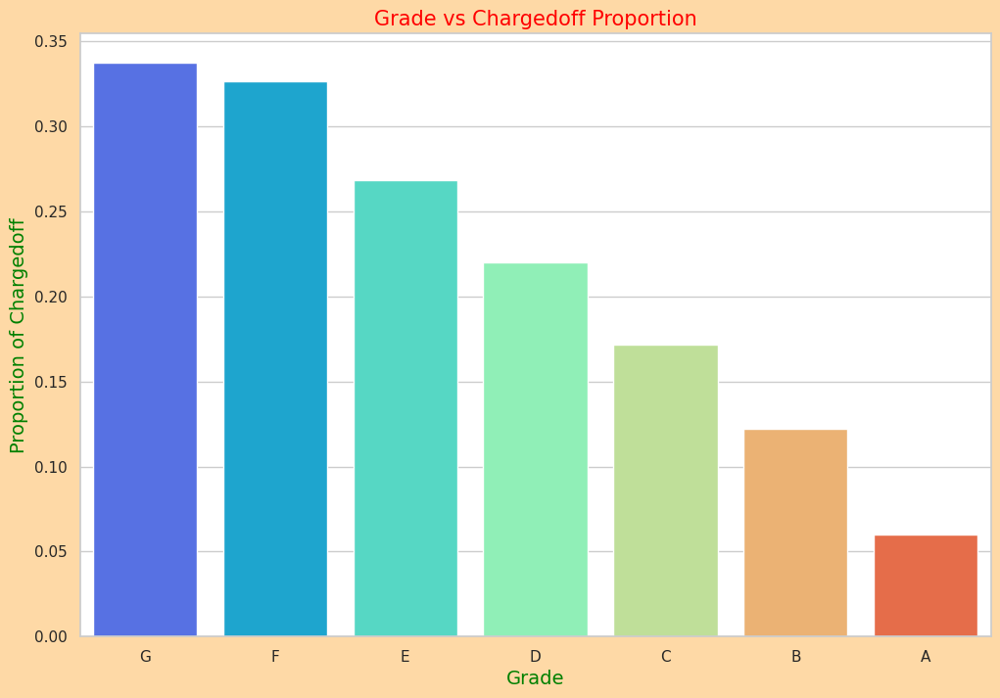

In [105]:
#lets plot the bar for grade against loan_status
show_bar_categorical(credit_grade_vs_status,'grade','Proportion_Chargedoff','Grade vs Chargedoff Proportion','Grade','Proportion of Chargedoff')

In [106]:
#analysis of interest rate vs loan_status
interest_rate_vs_status = generate_df_using_proportion_of_chargedoff(loan_df,'int_rate_category')
interest_rate_vs_status

loan_status,int_rate_category,Charged Off,Fully Paid,Total,Proportion_Chargedoff
3,16 +,1266,3372,4638,0.272962
2,12.5-16,2003,9470,11473,0.174584
1,10-13,1232,8148,9380,0.131343
0,0-10,830,11486,12316,0.067392


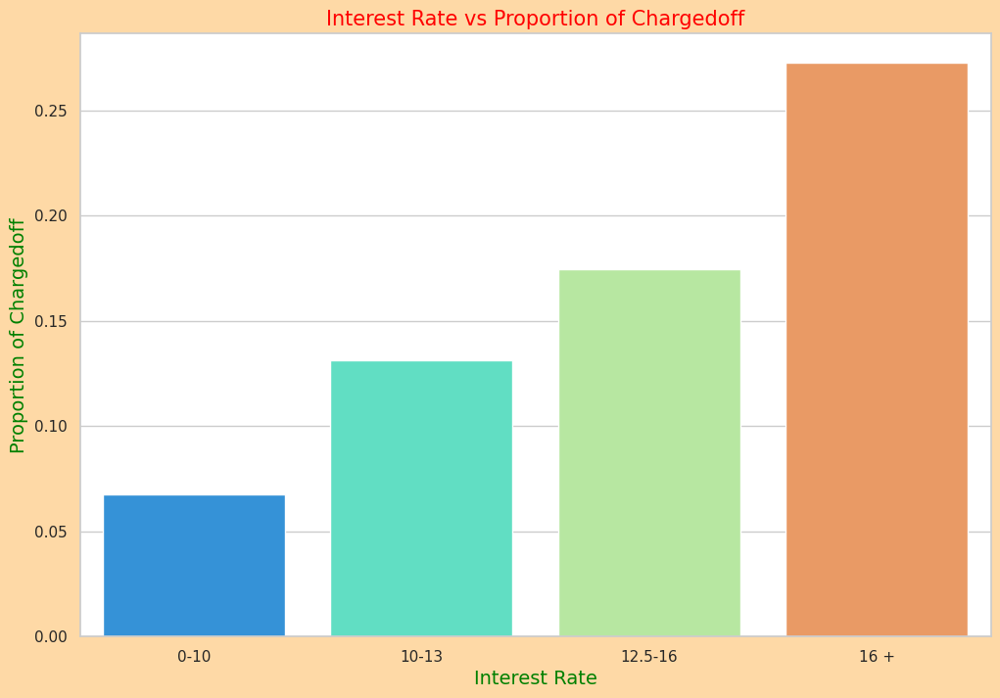

In [107]:
#lets plot the bar for grade against loan_status
show_bar_categorical(interest_rate_vs_status,'int_rate_category','Proportion_Chargedoff','Interest Rate vs Proportion of Chargedoff','Interest Rate','Proportion of Chargedoff')

In [108]:
# Bivariate Analysis on employment length against Chargedoff_Proportion
emp_length_vs_status = generate_df_using_proportion_of_chargedoff(loan_df,'emp_length')
emp_length_vs_status

loan_status,emp_length,Charged Off,Fully Paid,Total,Proportion_Chargedoff
0,0,228,805,1033,0.220716
2,10,1331,7157,8488,0.156810
8,7,263,1448,1711,0.153711
6,5,458,2736,3194,0.143394
1,1,1095,6582,7677,0.142634
7,6,307,1861,2168,0.141605
9,8,203,1232,1435,0.141463
4,3,555,3457,4012,0.138335
5,4,462,2880,3342,0.138241
3,2,567,3724,4291,0.132137


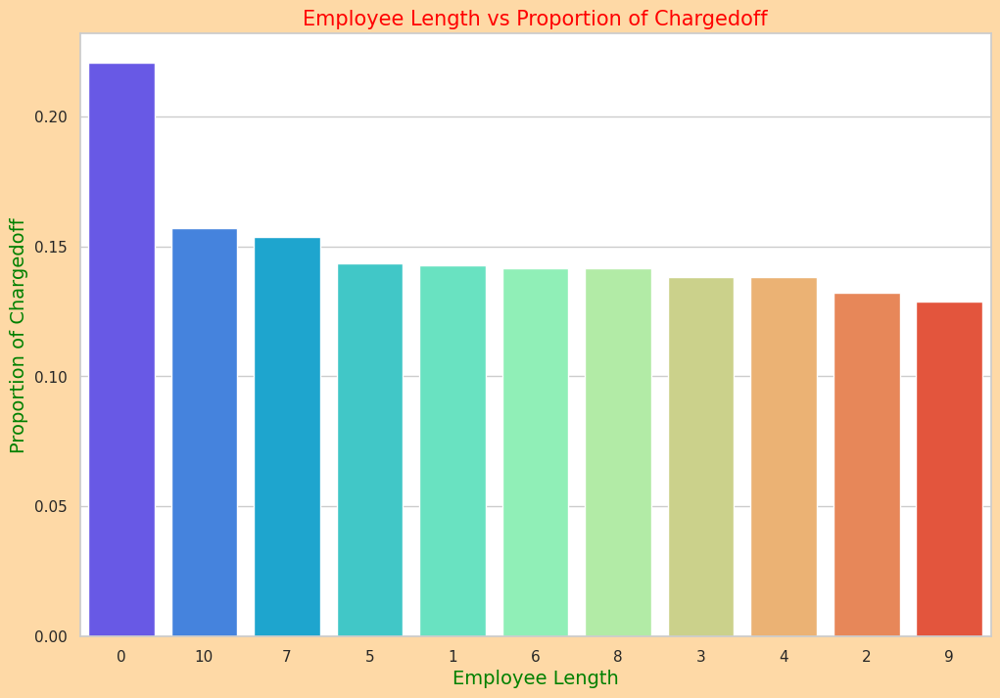

In [109]:
#lets plot the bar for grade against loan_status
show_bar_categorical(emp_length_vs_status,'emp_length','Proportion_Chargedoff','Employee Length vs Proportion of Chargedoff','Employee Length','Proportion of Chargedoff')

In [110]:
# Bivariate Analysis on address state against Chargedoff_Proportion\[
addr_state_vs_status = generate_df_using_proportion_of_chargedoff(loan_df,'addr_state')
addr_state_vs_status

loan_status,addr_state,Charged Off,Fully Paid,Total,Proportion_Chargedoff
28,NE,3.0,2.0,5.0,0.600000
32,NV,108.0,371.0,479.0,0.225470
40,SD,12.0,50.0,62.0,0.193548
0,AK,15.0,63.0,78.0,0.192308
9,FL,504.0,2277.0,2781.0,0.181230
24,MO,114.0,556.0,670.0,0.170149
11,HI,28.0,138.0,166.0,0.168675
13,ID,1.0,5.0,6.0,0.166667
31,NM,30.0,153.0,183.0,0.163934
36,OR,71.0,364.0,435.0,0.163218


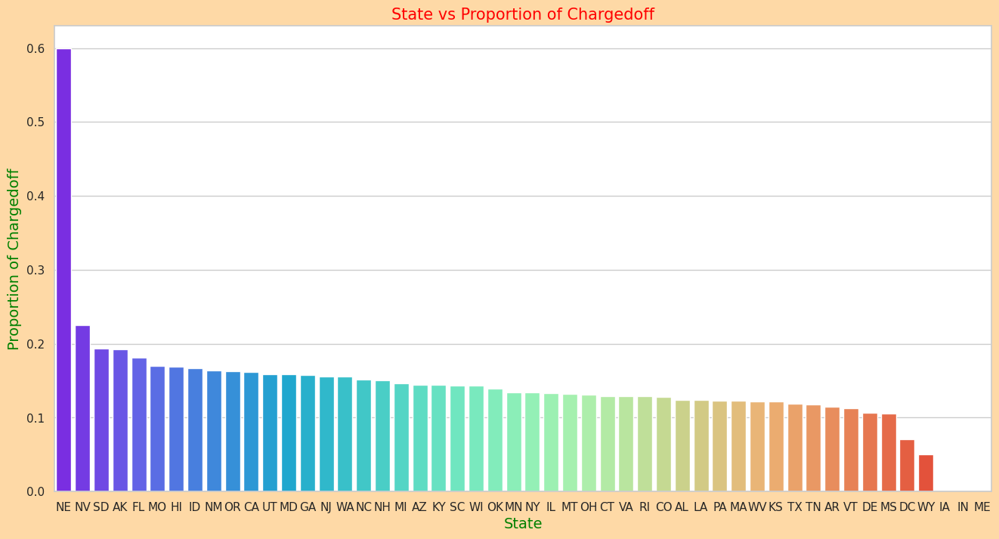

In [111]:
#lets plot the bar for grade against loan_status
show_bar_categorical(addr_state_vs_status,'addr_state','Proportion_Chargedoff','State vs Proportion of Chargedoff','State','Proportion of Chargedoff',(16,8))

In [112]:
#creating a table by grouping loan status for all purposes, calculating the chargedOff proporting for each bin and total 
verified_status_vs_loan_status = generate_df_using_proportion_of_chargedoff(loan_df,'verification_status')
verified_status_vs_loan_status

loan_status,verification_status,Charged Off,Fully Paid,Total,Proportion_Chargedoff
2,Verified,2051,10155,12206,0.168032
1,Source Verified,1434,8243,9677,0.148186
0,Not Verified,2142,14552,16694,0.128310


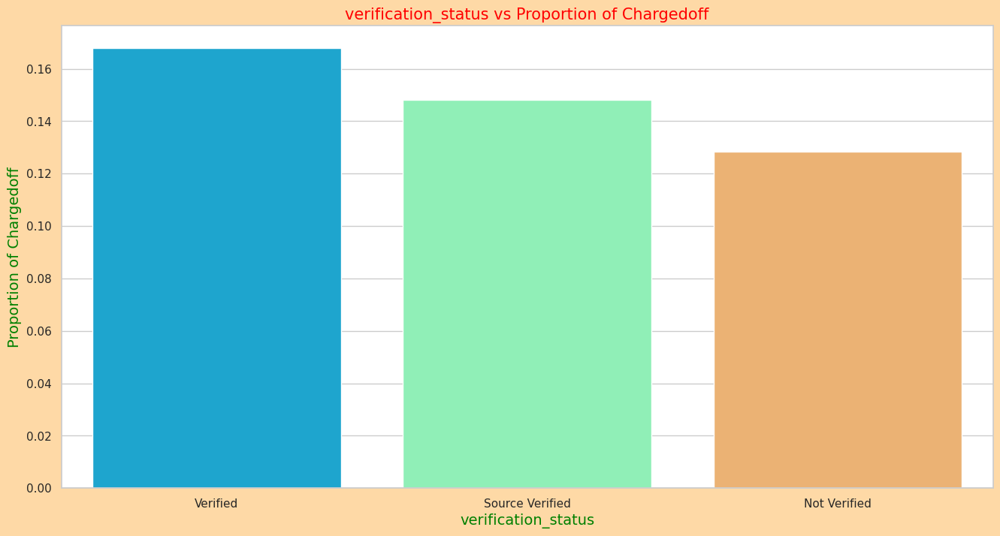

In [113]:
#lets plot the bar for verification_status against loan_status
show_bar_categorical(verified_status_vs_loan_status,'verification_status','Proportion_Chargedoff','verification_status vs Proportion of Chargedoff','verification_status','Proportion of Chargedoff',(16,8))

## Observations

* The proportion of annual income charged off has decreased.
* Income ranges above `80,000` have a lower likelihood of being charged off, while those between `0` and `20,000` face higher risks of default.
* Small business applicants exhibit a higher probability of default, whereas weddings show a lower rate of charge-offs.
* Credit grades consistently reflect creditworthiness, with Grade A indicating a lower likelihood of default.
* There's a correlation between higher interest rates and an increasing proportion of charged-off accounts. Additionally, accounts with interest rates of 16% or higher exhibit significantly elevated rates of charge-off.
* Box plots can be utilized to visualize the relationship between continuous or categorical variables and the likelihood of charge-off.



## Plotting box plot against for numerical variable/categorical variables vs categorical variable

### util function to create bivariate boxplot

In [114]:

def show_bivariate_boxplot(df, col1, col2, title, xlabel, ylabel, palette='rainbow'):
    """
    Show a bivariate boxplot to visualize the distribution of col2 across different categories of col1.

    Parameters:
        df (DataFrame): The pandas DataFrame containing the data.
        col1 (str): The column name for the x-axis.
        col2 (str): The column name for the y-axis.
        title (str): The title of the plot.
        xlabel (str): The label for the x-axis.
        ylabel (str): The label for the y-axis.
        palette (str or list): Optional. The color palette to use for the plot. Default is 'rainbow'.

    Returns:
        None
    """
    plt.figure(figsize=(12, 8), facecolor=Color.Mint.value)
    ax = sns.boxplot(x=col1, y=col2, data=df, palette=palette)
    ax.set_title(title, fontsize=15, color='blue')
    ax.set_xlabel(xlabel, fontsize=14, color='blue')
    ax.set_ylabel(ylabel, fontsize=14, color='blue')
    plt.show()

### util function to create bivariate boxplot with order

In [115]:

def show_bivariate_boxplot_order(df, col1, col2, title, xlabel, ylabel, order, palette='rainbow'):
    """
    Display a bivariate box plot with specified order of categories.

    Args:
    - df: DataFrame containing the data.
    - col1: Column name for x-axis.
    - col2: Column name for y-axis.
    - title: Title of the plot.
    - xlabel: Label for x-axis.
    - ylabel: Label for y-axis.
    - order: Order of categories for the x-axis.
    - palette: Color palette for the plot. Default is 'rainbow'.

    Returns:
    None
    """
    plt.figure(figsize=(12, 8), facecolor=Color.Light_Coffee_Pot.value)
    ax = sns.boxplot(y=col2, x=col1, data=df, palette=palette, order=order)
    ax.set_title(title, fontsize=15, color='green')
    ax.set_ylabel(ylabel, fontsize=14, color='green')
    ax.set_xlabel(xlabel, fontsize=14, color='green')
    plt.show()

### util function to create bivariate boxplot with order and hue

In [116]:

def show_bivariate_boxplot_order_hue(df, col1, col2, title, xlabel, ylabel, order=None, hue=None):
    """
    Generate a bivariate boxplot with optional ordering and hue.

    Parameters:
        df (DataFrame): The DataFrame containing the data.
        col1 (str): The column name for the x-axis.
        col2 (str): The column name for the y-axis.
        title (str): The title of the plot.
        xlabel (str): The label for the x-axis.
        ylabel (str): The label for the y-axis.
        order (list, optional): Order in which to display the x-axis categories.
        hue (str, optional): Variable in the data to map plot aspects to different colors.

    Returns:
        None
    """
    plt.figure(figsize=(12, 6), dpi=80, facecolor=Color.Tiffany_Blue.value, edgecolor='k')
    ax = sns.barplot(x=col1, y=col2, hue=hue, data=df, estimator=np.mean, order=order)
    ax.set_title(title, fontsize=15, color='w')
    ax.set_ylabel(ylabel, fontsize=14, color='w')
    ax.set_xlabel(xlabel, fontsize=14, color='w')
    plt.show()

# Bivariate Analysis - Purpose of loan vs Loan amount

Some observations can be made bringing two variables together

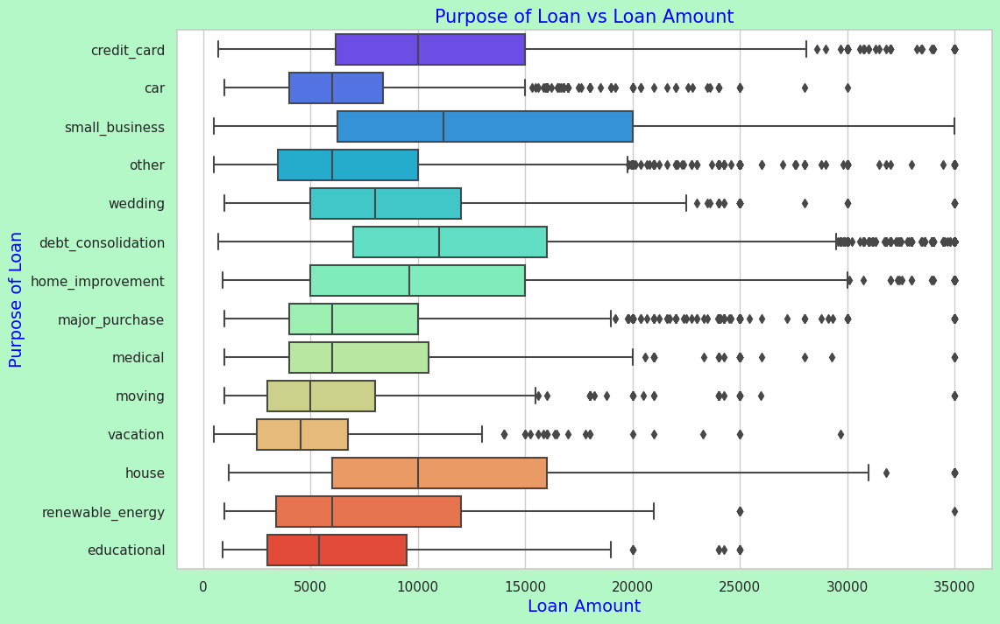

In [117]:
show_bivariate_boxplot(loan_df, 'loan_amnt','purpose','Purpose of Loan vs Loan Amount','Loan Amount','Purpose of Loan')

# Bivariate Analysis - Term of loan vs Interest Rate

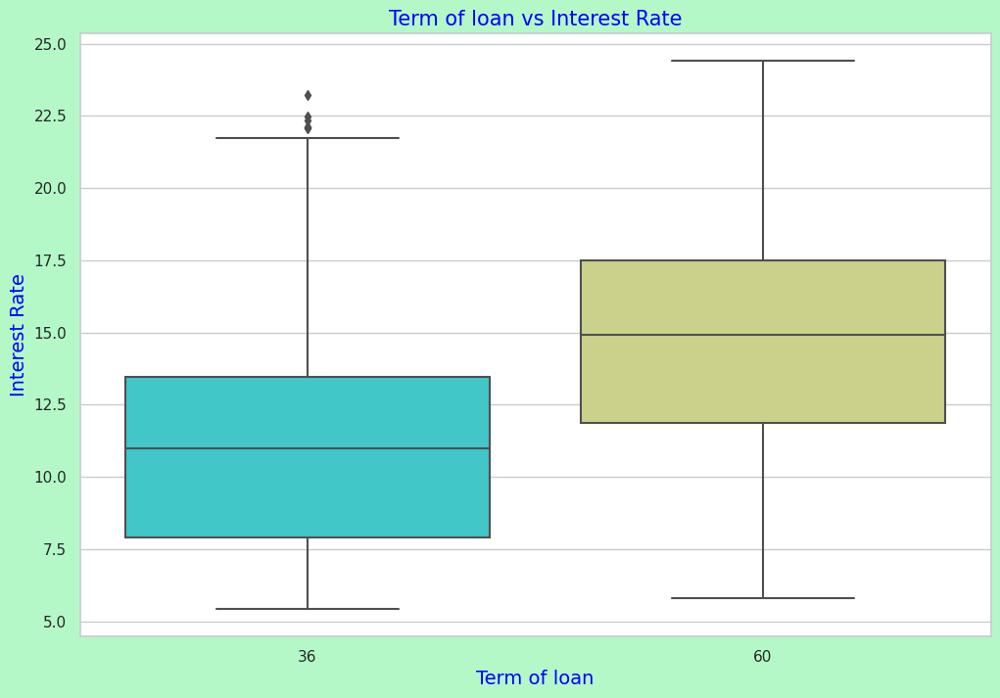

In [118]:
show_bivariate_boxplot(loan_df, 'term','int_rate','Term of loan vs Interest Rate','Term of loan','Interest Rate')

# Bivariate Analysis - Grade vs Interest Rate

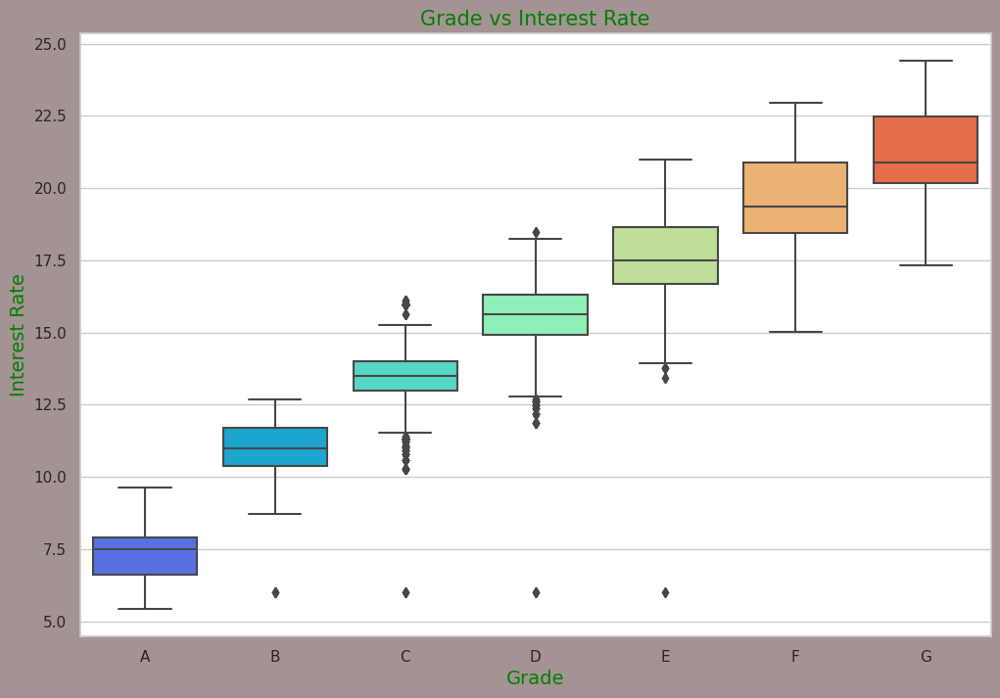

In [119]:
show_bivariate_boxplot_order(loan_df, 'grade','int_rate','Grade vs Interest Rate','Grade','Interest Rate','ABCDEFG')

## Bivariate Analysis - Annual Income across Grade for every loan status

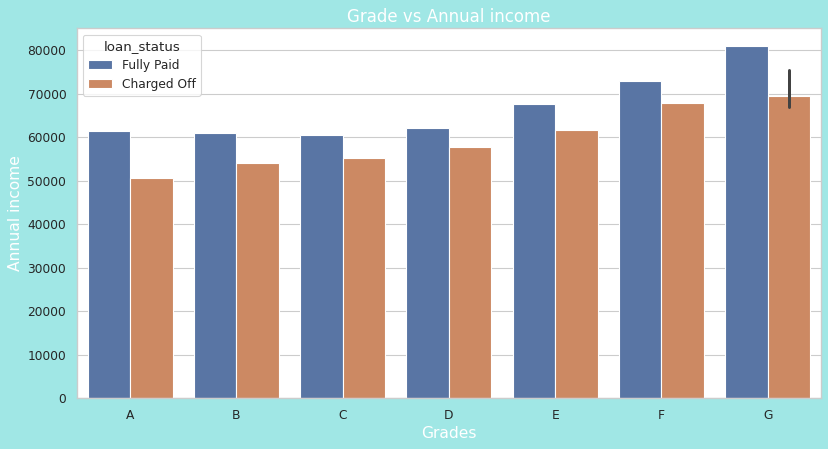

In [120]:
# variation of annual income across grade for every loan status with box plot
show_bivariate_boxplot_order_hue(loan_df,'grade','annual_inc','Grade vs Annual income','Grades','Annual income','ABCDEFG','loan_status')

# Bivariate Analysis - year vs Interest Rate

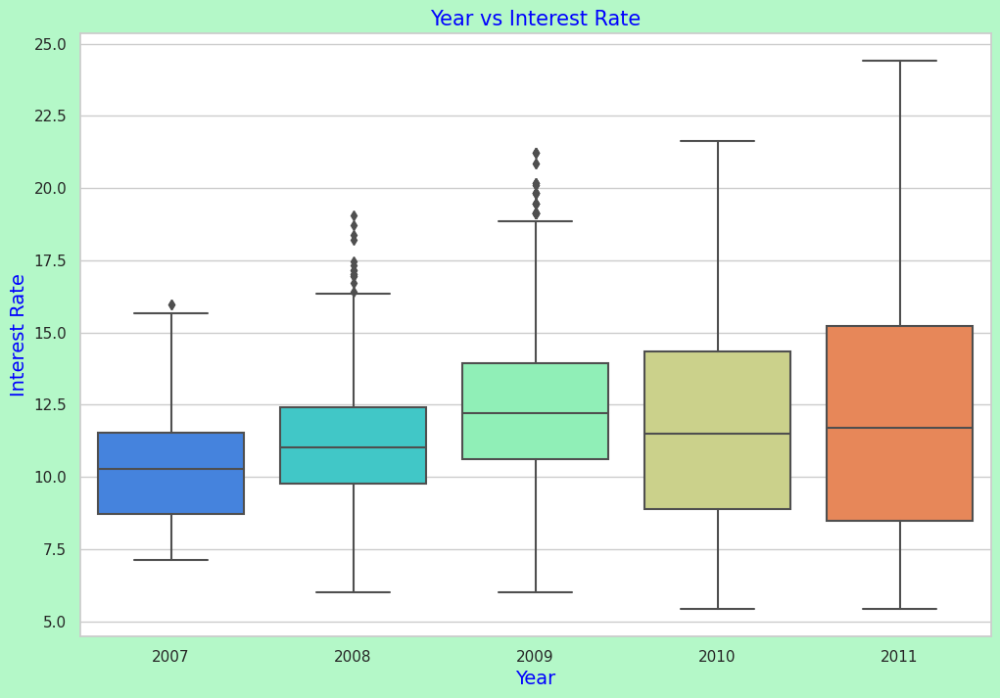

In [121]:
show_bivariate_boxplot(loan_df, 'issue_yr','int_rate','Year vs Interest Rate','Year','Interest Rate')

## Observations


1. It is clear that intrest rate is increasing with grades moving from A to F.

2. It is clear that avearge intrest rate is highest for small business purpose.

3. Higher Interest rates have higher terms

4. Though A grade borrowers have by and large fully paid the loans , lower income A grade people have default loans too.

5. The only relation between loan amount and charged off loans is that at higher loan amounts , defaulting is expected to be more

6. Plot shows intrest rate is increasing slowly with increase in year.

* From grade A to F, there's a noticeable trend of interest rates increasing.
* For small business purposes, the average interest rate appears to be the highest.
* Interest rates tend to increase with longer terms.
* While borrowers with A-grade ratings generally repay their loans in full, some lower-income individuals within the A-grade category still default on their loans.
* The relationship between loan amounts and defaulted loans suggests that higher loan amounts are associated with a higher likelihood of defaulting.
* According to the plot, there's a gradual increase in interest rates over the years.

# Multivariate Analysis

Multivarite Alalysis for Continuous and Categorical Variables on Defaulted Loans

Expanding upon the previous analysis, we'll delve deeper into examining the correlations among multiple variables simultaneously. 
Utilizing pivot tables, we can generate tables for multivariate analysis and visualize them through plotting heatmaps.

## New derived variable a flag for loan status

In [122]:
#adding a new derived variable a flag from loan status
loan_df["loan_status_boolean"]=np.where(loan_df.loan_status=='Charged Off',1,0)

## util function to generate a pivot table

In [123]:
#util function to generate a pivot table
def generate_pivot(df,index, columns,values):
    return pd.pivot_table(data=df,index=index, columns=columns,values=values,observed=False)

## util function to generate a heatmap

In [124]:
#util function to generate a pivot table
def show_heatmap(df, size=[7,5],cmap='RdYlGn'):
    plt.figure(figsize=size)
    sns.heatmap(df, annot=True, cmap=cmap)
    plt.show()

In [125]:
#pivoting grade vs loan_amnt_category vs loan_status flag
grade_pivot = generate_pivot(loan_df,'loan_amnt_category','grade','loan_status_boolean')
grade_pivot

grade,A,B,C,D,E,F,G
loan_amnt_category,,,,,,,
0-5000,0.072440,0.127066,0.175894,0.230097,0.279330,0.238095,0.500000
5000-10000,0.057136,0.123036,0.162162,0.210593,0.253968,0.306667,0.379310
10000-15000,0.054268,0.111526,0.163731,0.207721,0.255278,0.282609,0.446809
15000-20000,0.042017,0.122567,0.191423,0.243759,0.261044,0.314607,0.388889
20000-25000,0.050847,0.124183,0.180036,0.208661,0.293478,0.394231,0.229167
25000-30000,0.044118,0.120253,0.154639,0.245098,0.294118,0.304878,0.260870
30000-35000,0.019231,0.156028,0.230769,0.256881,0.276243,0.422222,0.343750


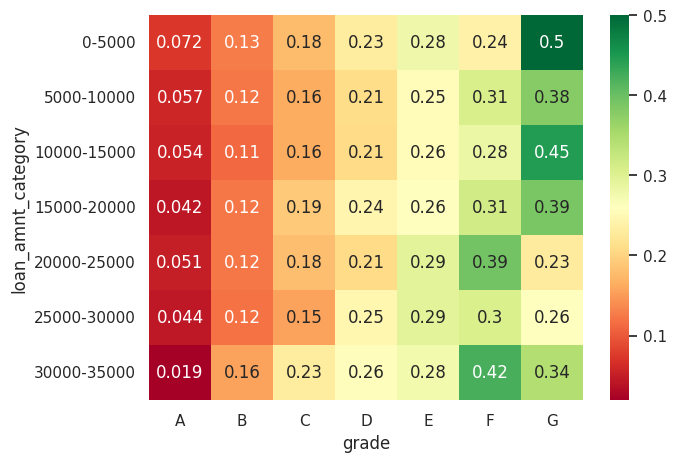

In [126]:
#heatmap of grade vs loan_amnt_category vs loan_status_boolean
show_heatmap(grade_pivot)

In [127]:
#pivot table of annual_inc_category vs int_rate_category vs loan_status_boolean
annual_income_int_rate_pivot = generate_pivot(loan_df, 'annual_inc_category', 'int_rate_category', 'loan_status_boolean')
annual_income_int_rate_pivot

int_rate_category,0-10,10-13,12.5-16,16 +
annual_inc_category,,,,
0-20000,0.119593,0.207746,0.245478,0.306306
20000-40000,0.099003,0.168825,0.211668,0.334586
40000-60000,0.070257,0.138427,0.183484,0.301307
60000-80000,0.052972,0.118790,0.156817,0.275468
80000 +,0.039208,0.092708,0.141248,0.202923


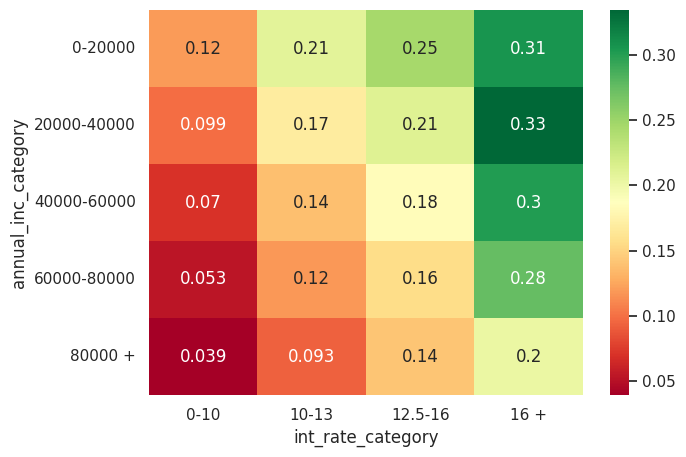

In [128]:
#heatmap of annual_inc_cats vs int_rate_cats vs loan_status_boolean
show_heatmap(annual_income_int_rate_pivot)

In [129]:
#create pivot table of ann_inc_group vs loan_amnt_group vs loan_stat_flag
loan_amnt_pivot = generate_pivot(loan_df, 'annual_inc_category', 'loan_amnt_category', 'loan_status_boolean')
loan_amnt_pivot

loan_amnt_category,0-5000,5000-10000,10000-15000,15000-20000,20000-25000,25000-30000,30000-35000
annual_inc_category,,,,,,,
0-20000,0.198473,0.214844,0.000000,0.000000,NaN,NaN,NaN
20000-40000,0.153609,0.170815,0.222968,0.257218,0.375000,0.333333,NaN
40000-60000,0.139685,0.126038,0.142387,0.218069,0.279773,0.330000,0.470588
60000-80000,0.112435,0.099836,0.127721,0.178766,0.178203,0.224138,0.349650
80000 +,0.076329,0.090993,0.087960,0.114022,0.169376,0.170492,0.243243


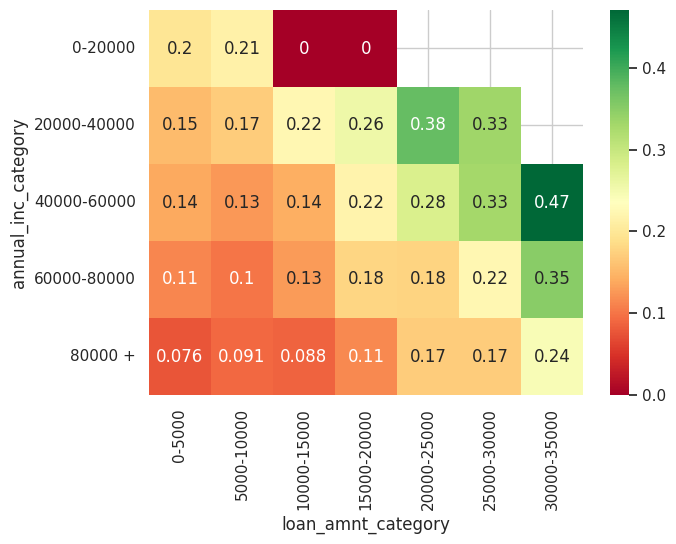

In [130]:
#heatmap of ann_inc_group vs loan_amnt_group vs loan_stat_flag
show_heatmap(loan_amnt_pivot)

In [131]:
#create pivot table of loan_amnt_cats vs int_rate_cats vs loan_stat_flag
loan_amnt_category_pivot = generate_pivot(loan_df, 'loan_amnt_category', 'int_rate_category', 'loan_status_boolean')
loan_amnt_category_pivot

int_rate_category,0-10,10-13,12.5-16,16 +
loan_amnt_category,,,,
0-5000,0.080896,0.133940,0.181883,0.281155
5000-10000,0.063568,0.135667,0.170201,0.256890
10000-15000,0.061786,0.118838,0.166157,0.249746
15000-20000,0.049505,0.136715,0.179030,0.288278
20000-25000,0.077181,0.125501,0.177254,0.302983
25000-30000,0.033708,0.125000,0.156863,0.285714
30000-35000,0.030769,0.166667,0.225434,0.268199


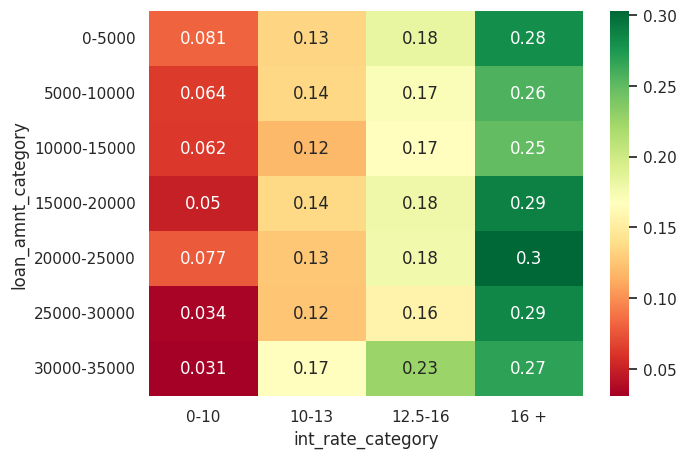

In [132]:
#heatmap of ann_inc_group vs int_rate_group vs loan_stat_flag
show_heatmap(loan_amnt_category_pivot)

In [133]:
#pivot table of ann_inc_group vs dti_category vs loan_stat_flag
annual_inc_cats_dti_pivot = generate_pivot(loan_df, 'annual_inc_category', 'dti_category', 'loan_status_boolean')
annual_inc_cats_dti_pivot

dti_category,0-5,05-10,10-15,15-20,25+
annual_inc_category,,,,,
0-20000,0.128440,0.213235,0.237918,0.176744,0.216561
20000-40000,0.151429,0.162821,0.184251,0.184710,0.193126
40000-60000,0.144363,0.130093,0.151230,0.163493,0.172603
60000-80000,0.098152,0.128069,0.133567,0.145415,0.154705
80000 +,0.101541,0.093558,0.111061,0.129345,0.139535


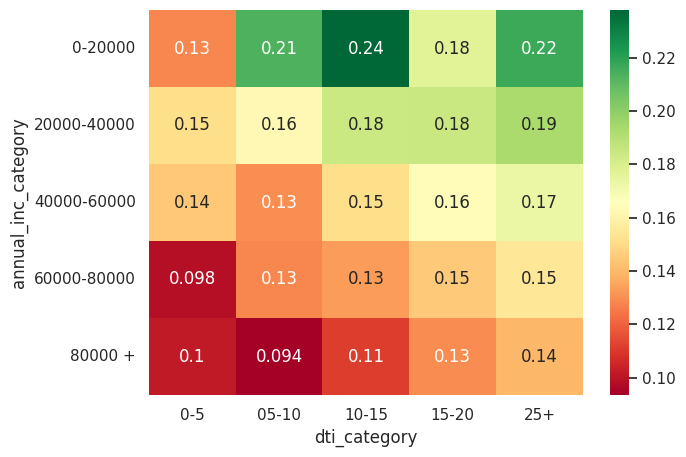

In [134]:
#heatmap of annual_inc_cats vs dti_cats vs loan_status_boolean
show_heatmap(annual_inc_cats_dti_pivot)

In [135]:
#create pivot table of purpose vs loan_amnt_category vs loan_status_boolean
loan_amnt_category_purpose_pivot = generate_pivot(loan_df, 'purpose', 'loan_amnt_category', 'loan_status_boolean')
loan_amnt_category_purpose_pivot

loan_amnt_category,0-5000,5000-10000,10000-15000,15000-20000,20000-25000,25000-30000,30000-35000
purpose,,,,,,,
car,0.101979,0.096367,0.146853,0.148936,0.235294,0.000000,NaN
credit_card,0.085421,0.097120,0.103821,0.133758,0.160714,0.098765,0.205479
debt_consolidation,0.151952,0.133000,0.138273,0.178093,0.184484,0.226506,0.247619
educational,0.137500,0.201835,0.181818,0.200000,0.375000,NaN,NaN
home_improvement,0.110381,0.117647,0.118812,0.120567,0.168224,0.109589,0.147727
house,0.166667,0.173554,0.158537,0.090909,0.105263,0.250000,0.266667
major_purchase,0.093855,0.094937,0.111111,0.151515,0.200000,0.111111,0.066667
medical,0.150350,0.144144,0.180851,0.204545,0.068966,0.333333,0.666667
moving,0.175227,0.155280,0.071429,0.117647,0.150000,1.000000,0.000000


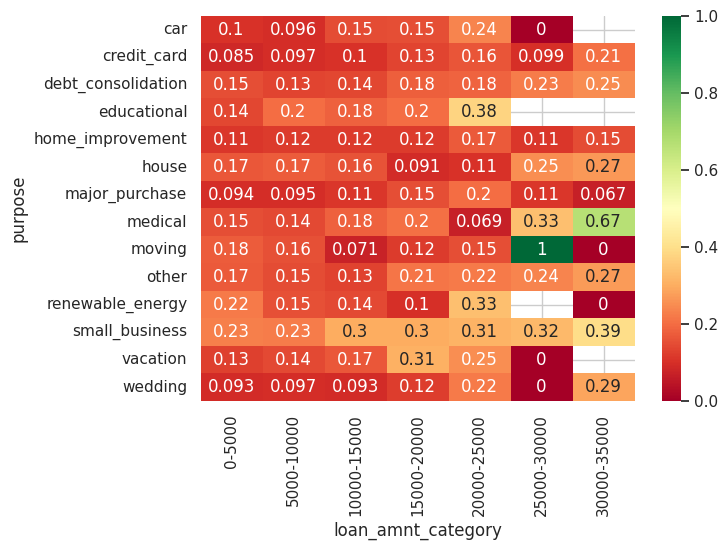

In [136]:
#heatmap of purpose vs loan_amnt_cats vs loan_status_boolean
show_heatmap(loan_amnt_category_purpose_pivot)

In [137]:
#create pivot table of purpose vs annual_inc vs loan_stat_flag
annual_inc_category_purpose_pivot = generate_pivot(loan_df, 'purpose', 'annual_inc_category', 'loan_status_boolean')
annual_inc_category_purpose_pivot

annual_inc_category,0-20000,20000-40000,40000-60000,60000-80000,80000 +
purpose,,,,,
car,0.144928,0.122616,0.113978,0.093985,0.090278
credit_card,0.098039,0.143595,0.107764,0.107414,0.083333
debt_consolidation,0.189252,0.186343,0.160714,0.139819,0.122243
educational,0.166667,0.193878,0.164179,0.150000,0.170213
home_improvement,0.181818,0.151442,0.152838,0.129204,0.086009
house,0.222222,0.211268,0.142857,0.112500,0.187500
major_purchase,0.178218,0.141805,0.118211,0.056000,0.066176
medical,0.375000,0.160221,0.153846,0.198347,0.100000
moving,0.222222,0.235294,0.150000,0.072289,0.108696


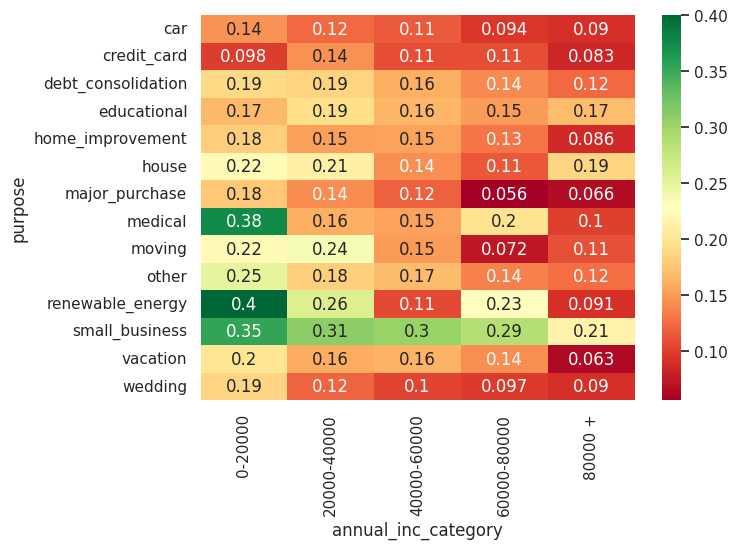

In [138]:
#heatmap of purpose vs annual_inc vs loan_status_boolean
show_heatmap(annual_inc_category_purpose_pivot)

In [139]:
#create pivot table of purpose vs annual_inc vs loan_stat_flag
annual_inc_category_sub_grade_pivot = generate_pivot(loan_df, 'sub_grade', 'annual_inc_category', 'loan_status_boolean')
annual_inc_category_sub_grade_pivot

annual_inc_category,0-20000,20000-40000,40000-60000,60000-80000,80000 +
sub_grade,,,,,
A1,0.107143,0.034335,0.035503,0.023904,0.004016
A2,0.071429,0.093373,0.060345,0.022951,0.016026
A3,0.087719,0.082725,0.058722,0.036827,0.048159
A4,0.101124,0.081081,0.071934,0.054422,0.029982
A5,0.177778,0.124585,0.081425,0.057836,0.045151
B1,0.114754,0.127932,0.099609,0.083799,0.056075
B2,0.202703,0.142553,0.110733,0.093923,0.087805
B3,0.172414,0.157643,0.119855,0.120818,0.082333
B4,0.243243,0.167587,0.141141,0.127168,0.094620


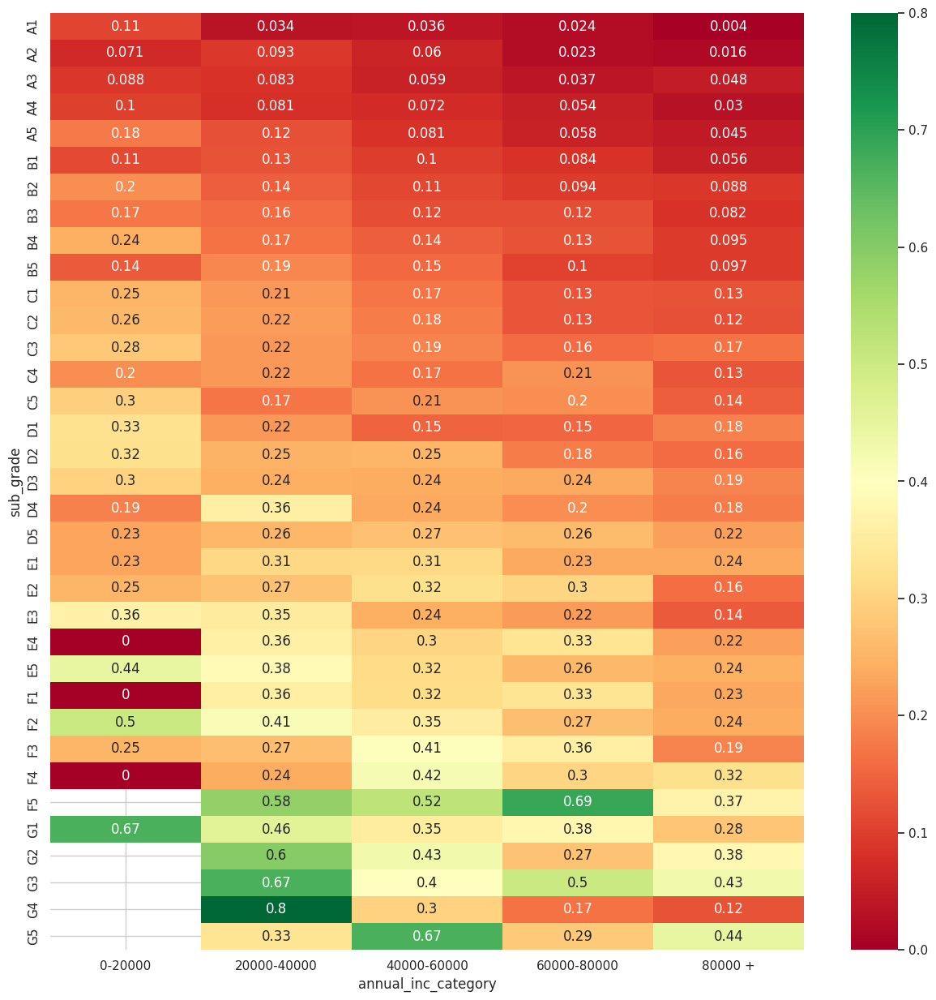

In [140]:
#heatmap of purpose vs annual_inc vs loan_status_boolean
show_heatmap(annual_inc_category_sub_grade_pivot,size=[15,15])

# Observations

* Correlation between Lower Incomes and Higher Interest Rates with Increased Default Rates
* Enhanced Creditworthiness with Rising Loan Amounts or Annual Incomes; Realistically, Higher Incomes Reflect Higher Credit Grades
* Decline in Debt-to-Income Ratios with Income Escalation
* Inferior Income Levels Associated with Small Business Default Tendencies in Borrowers


## Recommendations

**Revised Recommendations**

**Continuous Variable:**
- Loans exceeding `15,000` exhibit a higher likelihood of borrower default.
- Funding amounts surpassing `15,000` correlate with elevated default rates.
- Investments exceeding `15,000` demonstrate a higher tendency for default.

**Interest Rate Influence:**
- A notable increase in default rates accompanies rising interest rates.

**Income and Debt-to-Income Ratio (DTI):**
- Elevated annual incomes correspond to reduced default rates.
- Conversely, increasing DTI correlates with heightened default rates.

**Influence of Academic Achievement and Income:**
- Higher incomes coupled with favorable academic performance typically result in fewer defaults.

**Creditworthiness Assessment:**
- Grades and subgrades predominantly reflect the creditworthiness of borrowers.

**Categorical Variable:**
- Loan terms of 60 months exhibit a higher default propensity compared to 36-month terms.
- Default rates escalate as the grade (A, B, C, D, E, F, G) decreases.
- Similarly, default rates rise with decreasing subgrade (A1, A2, B1, B2, etc.).

**Verification and Borrower Type:**
- Verified borrowers tend to display a higher percentage of defaulted loans.
- Small business borrowers are associated with a heightened default risk.

**Geographical Influence:**
- The percentage of defaulted loans is notably higher in states like NE and relatively elevated in NV and SD.
